# Figures

In [2]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import seaborn as sns
import scvelo as scv
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from matplotlib_venn import venn2
from venny4py.venny4py import *
from scipy.spatial.distance import cosine
from scipy.stats import wasserstein_distance
from scipy.spatial import distance
from scipy.stats import pearsonr
import matplotlib as mpl
from scvelo.core import LinearRegression

In [135]:
import warnings
warnings.filterwarnings('ignore')

## load data

In [3]:
# Stewart
stewart_velocyto = sc.read_h5ad("../Stewart/data/stewart_velocyto.h5ad")
stewart_alevin = sc.read_h5ad("../Stewart/data/stewart_salmon.h5ad")
stewart_velocyto_sto = sc.read_h5ad("../Stewart/data/stewart_velocyto_sto.h5ad")
stewart_alevin_sto = sc.read_h5ad("../Stewart/data/stewart_alevin_sto.h5ad")

# Mathew
mathew_velocyto = sc.read_h5ad("../Mathew/data/mathew_velocyto.h5ad")
mathew_alevin = sc.read_h5ad("../Mathew/data/mathew_salmon.h5ad")
mathew_velocyto_sto = sc.read_h5ad("../Mathew/data/mathew_velocyto_sto.h5ad")
mathew_alevin_sto = sc.read_h5ad("../Mathew/data/mathew_alevin_sto.h5ad")

# Fu
fu_velocyto = sc.read_h5ad("../Fu/data/fu_velocyto.h5ad")
fu_alevin = sc.read_h5ad("../Fu/data/fu_salmon.h5ad")
fu_velocyto_sto = sc.read_h5ad("../Fu/data/fu_velocyto_sto.h5ad")
fu_alevin_sto = sc.read_h5ad("../Fu/data/fu_alevin_sto.h5ad")

# separate Fu into paired-end and single-end alignment
fu_pe_velocyto = fu_velocyto[~fu_velocyto.obs["id"].isin(["MJ001", "MJ002", "MJ003", "MJ017", "MJ016"]),:]
fu_se_velocyto = fu_velocyto[fu_velocyto.obs["id"].isin(["MJ001", "MJ002", "MJ003", "MJ017", "MJ016"]),:]
fu_pe_alevin = fu_alevin[~fu_alevin.obs["id"].isin(["MJ001", "MJ002", "MJ003", "MJ017", "MJ016"]),:]
fu_se_alevin = fu_alevin[fu_alevin.obs["id"].isin(["MJ001", "MJ002", "MJ003", "MJ017", "MJ016"]),:]

fu_pe_velocyto_sto = fu_velocyto_sto[~fu_velocyto_sto.obs["id"].isin(["MJ001", "MJ002", "MJ003", "MJ017", "MJ016"]),:]
fu_se_velocyto_sto = fu_velocyto_sto[fu_velocyto_sto.obs["id"].isin(["MJ001", "MJ002", "MJ003", "MJ017", "MJ016"]),:]
fu_pe_alevin_sto = fu_alevin_sto[~fu_alevin_sto.obs["id"].isin(["MJ001", "MJ002", "MJ003", "MJ017", "MJ016"]),:]
fu_se_alevin_sto = fu_alevin_sto[fu_alevin_sto.obs["id"].isin(["MJ001", "MJ002", "MJ003", "MJ017", "MJ016"]),:]

## Figure 1

### Figure 1a: total counts (u+s+a)

In [4]:
# get u,s,a counts per cell

stewart_velocyto_spliced = np.array(stewart_velocyto.layers["spliced"].sum(axis=1)).flatten()
stewart_velocyto_unspliced = np.array(stewart_velocyto.layers["unspliced"].sum(axis=1)).flatten()
stewart_velocyto_ambiguous = np.array(stewart_velocyto.layers["ambiguous"].sum(axis=1)).flatten()

stewart_alevin_spliced = np.array(stewart_alevin.layers["spliced"].sum(axis=1)).flatten()
stewart_alevin_unspliced = np.array(stewart_alevin.layers["unspliced"].sum(axis=1)).flatten()
stewart_alevin_ambiguous = np.array(stewart_alevin.layers["ambiguous"].sum(axis=1)).flatten()

mathew_velocyto_spliced = np.array(mathew_velocyto.layers["spliced"].sum(axis=1)).flatten()
mathew_velocyto_unspliced = np.array(mathew_velocyto.layers["unspliced"].sum(axis=1)).flatten()
mathew_velocyto_ambiguous = np.array(mathew_velocyto.layers["ambiguous"].sum(axis=1)).flatten()

mathew_alevin_spliced = np.array(mathew_alevin.layers["spliced"].sum(axis=1)).flatten()
mathew_alevin_unspliced = np.array(mathew_alevin.layers["unspliced"].sum(axis=1)).flatten()
mathew_alevin_ambiguous = np.array(mathew_alevin.layers["ambiguous"].sum(axis=1)).flatten()

fu_velocyto_spliced = np.array(fu_velocyto.layers["spliced"].sum(axis=1)).flatten()
fu_velocyto_unspliced = np.array(fu_velocyto.layers["unspliced"].sum(axis=1)).flatten()
fu_velocyto_ambiguous = np.array(fu_velocyto.layers["ambiguous"].sum(axis=1)).flatten()

fu_alevin_spliced = np.array(fu_alevin.layers["spliced"].sum(axis=1)).flatten()
fu_alevin_unspliced = np.array(fu_alevin.layers["unspliced"].sum(axis=1)).flatten()
fu_alevin_ambiguous = np.array(fu_alevin.layers["ambiguous"].sum(axis=1)).flatten()

fu_pe_velocyto_spliced = np.array(fu_pe_velocyto.layers["spliced"].sum(axis=1)).flatten()
fu_pe_velocyto_unspliced = np.array(fu_pe_velocyto.layers["unspliced"].sum(axis=1)).flatten()
fu_pe_velocyto_ambiguous = np.array(fu_pe_velocyto.layers["ambiguous"].sum(axis=1)).flatten()

fu_pe_alevin_spliced = np.array(fu_pe_alevin.layers["spliced"].sum(axis=1)).flatten()
fu_pe_alevin_unspliced = np.array(fu_pe_alevin.layers["unspliced"].sum(axis=1)).flatten()
fu_pe_alevin_ambiguous = np.array(fu_pe_alevin.layers["ambiguous"].sum(axis=1)).flatten()

fu_se_velocyto_spliced = np.array(fu_se_velocyto.layers["spliced"].sum(axis=1)).flatten()
fu_se_velocyto_unspliced = np.array(fu_se_velocyto.layers["unspliced"].sum(axis=1)).flatten()
fu_se_velocyto_ambiguous = np.array(fu_se_velocyto.layers["ambiguous"].sum(axis=1)).flatten()

fu_se_alevin_spliced = np.array(fu_se_alevin.layers["spliced"].sum(axis=1)).flatten()
fu_se_alevin_unspliced = np.array(fu_se_alevin.layers["unspliced"].sum(axis=1)).flatten()
fu_se_alevin_ambiguous = np.array(fu_se_alevin.layers["ambiguous"].sum(axis=1)).flatten()

In [5]:
# get total counts per cell
stewart_velocyto_counts = stewart_velocyto_spliced + stewart_velocyto_unspliced + stewart_velocyto_ambiguous
stewart_alevin_counts = stewart_alevin_spliced + stewart_alevin_unspliced + stewart_alevin_ambiguous

mathew_velocyto_counts = mathew_velocyto_spliced + mathew_velocyto_unspliced + mathew_velocyto_ambiguous
mathew_alevin_counts = mathew_alevin_spliced + mathew_alevin_unspliced + mathew_alevin_ambiguous

fu_velocyto_counts = fu_velocyto_spliced + fu_velocyto_unspliced + fu_velocyto_ambiguous
fu_alevin_counts = fu_alevin_spliced + fu_alevin_unspliced + fu_alevin_ambiguous

fu_pe_velocyto_counts = fu_pe_velocyto_spliced + fu_pe_velocyto_unspliced + fu_pe_velocyto_ambiguous
fu_pe_alevin_counts = fu_pe_alevin_spliced + fu_pe_alevin_unspliced + fu_pe_alevin_ambiguous

fu_se_velocyto_counts = fu_se_velocyto_spliced + fu_se_velocyto_unspliced + fu_se_velocyto_ambiguous
fu_se_alevin_counts = fu_se_alevin_spliced + fu_se_alevin_unspliced + fu_se_alevin_ambiguous

In [6]:
print("Total UMIs velocyto Stewart: ", stewart_velocyto_counts.sum())
print("Total UMIs alevin   Stewart: ", stewart_alevin_counts.sum())
print("Ratio Stewart: ", stewart_alevin_counts.sum() / stewart_velocyto_counts.sum(), "\n")

print("Total UMIs velocyto Mathew:  ", mathew_velocyto_counts.sum())
print("Total UMIs alevin   Mathew:  ", mathew_alevin_counts.sum())
print("Ratio Mathew: ", mathew_alevin_counts.sum() / mathew_velocyto_counts.sum(), "\n")

print("Total UMIs velocyto Fu (SE): ", fu_se_velocyto_counts.sum())
print("Total UMIs alevin   Fu (SE): ", fu_se_alevin_counts.sum())
print("Ratio Fu (SE): ", fu_se_alevin_counts.sum() / fu_se_velocyto_counts.sum(), "\n")

print("Total UMIs velocyto Fu (PE): ", fu_pe_velocyto_counts.sum())
print("Total UMIs alevin   Fu (PE): ", fu_pe_alevin_counts.sum())
print("Ratio Fu (PE): ", fu_pe_alevin_counts.sum() / fu_pe_velocyto_counts.sum(), "\n")

Total UMIs velocyto Stewart:  3346767
Total UMIs alevin   Stewart:  35162924.0
Ratio Stewart:  10.506534814045914 

Total UMIs velocyto Mathew:   15429773
Total UMIs alevin   Mathew:   259068430.0
Ratio Mathew:  16.79016483262586 

Total UMIs velocyto Fu (SE):  6260049
Total UMIs alevin   Fu (SE):  44260924.0
Ratio Fu (SE):  7.070379800541497 

Total UMIs velocyto Fu (PE):  107488677
Total UMIs alevin   Fu (PE):  159906380.0
Ratio Fu (PE):  1.487657941868612 



In [7]:
# get total cellranger counts
sc.pp.calculate_qc_metrics(stewart_velocyto, layer="counts", inplace=True, log1p=False)
sc.pp.calculate_qc_metrics(mathew_velocyto, layer="counts", inplace=True, log1p=False)
sc.pp.calculate_qc_metrics(fu_velocyto, layer="counts", inplace=True, log1p=False)
sc.pp.calculate_qc_metrics(fu_pe_velocyto, layer="counts", inplace=True, log1p=False)
sc.pp.calculate_qc_metrics(fu_se_velocyto, layer="counts", inplace=True, log1p=False)

In [8]:
# create dataframe for boxplot
fig1a = pd.DataFrame({"Counts": np.concatenate([stewart_velocyto_counts, stewart_alevin_counts, stewart_velocyto.obs["total_counts"].values, 
                                                mathew_velocyto_counts, mathew_alevin_counts, mathew_velocyto.obs["total_counts"].values,
                                                fu_se_velocyto_counts, fu_se_alevin_counts, fu_se_velocyto.obs["total_counts"].values,
                                                fu_pe_velocyto_counts, fu_pe_alevin_counts, fu_pe_velocyto.obs["total_counts"].values]),
                      "Dataset": np.concatenate([["Stewart et al."] * stewart_velocyto.n_obs * 3,
                                                 ["Mathew et al."] * mathew_velocyto.n_obs * 3,
                                                 ["Fu et al. (SE)"] * fu_se_velocyto.n_obs * 3,
                                                 ["Fu et al. (PE)"] * fu_pe_velocyto.n_obs * 3]),
                      "Method": np.concatenate([["Velocyto"] * stewart_velocyto.n_obs, ["Alevin-fry"] * stewart_velocyto.n_obs, ["Cellranger"] * stewart_velocyto.n_obs,
                                                ["Velocyto"] * mathew_velocyto.n_obs, ["Alevin-fry"] * mathew_velocyto.n_obs, ["Cellranger"] * mathew_velocyto.n_obs,
                                                ["Velocyto"] * fu_se_velocyto.n_obs, ["Alevin-fry"] * fu_se_velocyto.n_obs, ["Cellranger"] * fu_se_velocyto.n_obs,
                                                ["Velocyto"] * fu_pe_velocyto.n_obs, ["Alevin-fry"] * fu_pe_velocyto.n_obs, ["Cellranger"] * fu_pe_velocyto.n_obs])})

### Figure 1b: difference cellranger/salmon counts - u+s+a counts

In [9]:
# get cellranger/salmon total counts per cell
stewart_cellranger_total = np.array(stewart_velocyto.layers["counts"].sum(axis=1)).flatten()
stewart_salmon_total = np.array(stewart_alevin.layers["counts"].sum(axis=1)).flatten()

mathew_cellranger_total = np.array(mathew_velocyto.layers["counts"].sum(axis=1)).flatten()
mathew_salmon_total = np.array(mathew_alevin.layers["counts"].sum(axis=1)).flatten()

fu_cellranger_total = np.array(fu_velocyto.layers["counts"].sum(axis=1)).flatten()
fu_salmon_total = np.array(fu_alevin.layers["counts"].sum(axis=1)).flatten()

fu_se_cellranger_total = np.array(fu_se_velocyto.layers["counts"].sum(axis=1)).flatten()
fu_se_salmon_total = np.array(fu_se_alevin.layers["counts"].sum(axis=1)).flatten()

fu_pe_cellranger_total = np.array(fu_pe_velocyto.layers["counts"].sum(axis=1)).flatten()
fu_pe_salmon_total = np.array(fu_pe_alevin.layers["counts"].sum(axis=1)).flatten()

In [10]:
# get difference per cell
stewart_velocyto_diff = stewart_cellranger_total - stewart_velocyto_counts
stewart_alevin_diff = stewart_salmon_total - stewart_alevin_counts

mathew_velocyto_diff = mathew_cellranger_total - mathew_velocyto_counts
mathew_alevin_diff = mathew_salmon_total - mathew_alevin_counts

fu_velocyto_diff = fu_cellranger_total - fu_velocyto_counts
fu_alevin_diff = fu_salmon_total - fu_alevin_counts

fu_se_velocyto_diff = fu_se_cellranger_total - fu_se_velocyto_counts
fu_se_alevin_diff = fu_se_salmon_total - fu_se_alevin_counts

fu_pe_velocyto_diff = fu_pe_cellranger_total - fu_pe_velocyto_counts
fu_pe_alevin_diff = fu_pe_salmon_total - fu_pe_alevin_counts

In [11]:
# create dataframe for violinplot
fig1b = pd.DataFrame({"Pct": np.concatenate([stewart_velocyto_diff, stewart_alevin_diff,
                                             mathew_velocyto_diff, mathew_alevin_diff,
                                             fu_se_velocyto_diff, fu_se_alevin_diff,
                                             fu_pe_velocyto_diff, fu_pe_alevin_diff]),
                      "Dataset": np.concatenate([["Stewart et al."] * stewart_velocyto.n_obs *2,
                                                 ["Mathew et al."] * mathew_velocyto.n_obs *2,
                                                 ["Fu et al. (SE)"] * fu_se_velocyto.n_obs * 2,
                                                 ["Fu et al. (PE)"] * fu_pe_velocyto.n_obs * 2]),
                      "Method": np.concatenate([["Velocyto"] * stewart_velocyto.n_obs, ["Alevin-fry"] * stewart_velocyto.n_obs,
                                                ["Velocyto"] * mathew_velocyto.n_obs, ["Alevin-fry"] * mathew_velocyto.n_obs,
                                                ["Velocyto"] * fu_se_velocyto.n_obs, ["Alevin-fry"] * fu_se_velocyto.n_obs,
                                                ["Velocyto"] * fu_pe_velocyto.n_obs, ["Alevin-fry"] * fu_pe_velocyto.n_obs])})

In [12]:
# get means
print("Mean difference velocyto:")
print("Stewart et al.:", fig1b.loc[(fig1b["Method"] == "Velocyto") & (fig1b["Dataset"] == "Stewart et al."), "Pct"].mean())
print("Mathew et al.:", fig1b.loc[(fig1b["Method"] == "Velocyto") & (fig1b["Dataset"] == "Mathew et al."), "Pct"].mean())
print("Fu et al. (SE):", fig1b.loc[(fig1b["Method"] == "Velocyto") & (fig1b["Dataset"] == "Fu et al. (SE)"), "Pct"].mean())
print("Fu et al. (PE):", fig1b.loc[(fig1b["Method"] == "Velocyto") & (fig1b["Dataset"] == "Fu et al. (PE)"), "Pct"].mean())

print("Mean difference alevin:")
print("Stewart et al.:", fig1b.loc[(fig1b["Method"] == "Alevin-fry") & (fig1b["Dataset"] == "Stewart et al."), "Pct"].mean())
print("Mathew et al.:", fig1b.loc[(fig1b["Method"] == "Alevin-fry") & (fig1b["Dataset"] == "Mathew et al."), "Pct"].mean())
print("Fu et al. (SE):", fig1b.loc[(fig1b["Method"] == "Alevin-fry") & (fig1b["Dataset"] == "Fu et al. (SE)"), "Pct"].mean())
print("Fu et al. (PE):", fig1b.loc[(fig1b["Method"] == "Alevin-fry") & (fig1b["Dataset"] == "Fu et al. (PE)"), "Pct"].mean())

Mean difference velocyto:
Stewart et al.: 3552.3376050709658
Mathew et al.: 7865.659379596203
Fu et al. (SE): 2271.2785620612513
Fu et al. (PE): 1080.1444294577825
Mean difference alevin:
Stewart et al.: 0.0
Mathew et al.: -6.768451664661051
Fu et al. (SE): -25.635886754609274
Fu et al. (PE): -20.5637712435932


### Figure 1c: correlation of counts with spliced counts of same gene

In [13]:
# get correlations

stewart_velo_corr = [pearsonr(stewart_velocyto[:,gene].layers["counts"].toarray().ravel(),
                             stewart_velocyto[:,gene].layers["spliced"].toarray().ravel())[0] 
                     for gene in stewart_velocyto.var_names]

stewart_alevin_corr = [pearsonr(stewart_alevin[:,gene].layers["counts"].toarray().ravel(),
                                stewart_alevin[:,gene].layers["spliced"].toarray().ravel())[0] 
                       for gene in stewart_alevin.var_names]

mathew_velo_corr = [pearsonr(mathew_velocyto[:,gene].layers["counts"].toarray().ravel(),
                             mathew_velocyto[:,gene].layers["spliced"].toarray().ravel())[0] 
                    for gene in mathew_velocyto.var_names]

mathew_alevin_corr = [pearsonr(mathew_alevin[:,gene].layers["counts"].toarray().ravel(),
                               mathew_alevin[:,gene].layers["spliced"].toarray().ravel())[0] 
                      for gene in mathew_alevin.var_names]

fu_se_velo_corr = [pearsonr(fu_se_velocyto[:,gene].layers["counts"].toarray().ravel(),
                            fu_se_velocyto[:,gene].layers["spliced"].toarray().ravel())[0] 
                   for gene in fu_se_velocyto.var_names]

fu_se_alevin_corr = [pearsonr(fu_se_alevin[:,gene].layers["counts"].toarray().ravel(),
                              fu_se_alevin[:,gene].layers["spliced"].toarray().ravel())[0] 
                     for gene in fu_se_alevin.var_names]

fu_pe_velo_corr = [pearsonr(fu_pe_velocyto[:,gene].layers["counts"].toarray().ravel(),
                            fu_pe_velocyto[:,gene].layers["spliced"].toarray().ravel())[0] 
                   for gene in fu_pe_velocyto.var_names]

fu_pe_alevin_corr = [pearsonr(fu_pe_alevin[:,gene].layers["counts"].toarray().ravel(),
                              fu_pe_alevin[:,gene].layers["spliced"].toarray().ravel())[0] 
                     for gene in fu_pe_alevin.var_names]

In [14]:
# create dataframe for boxplot
fig1c = pd.DataFrame({"Pearson correlation": np.concatenate([stewart_velo_corr, stewart_alevin_corr,
                                                             mathew_velo_corr, mathew_alevin_corr,
                                                             fu_se_velo_corr, fu_se_alevin_corr,
                                                             fu_pe_velo_corr, fu_pe_alevin_corr ]),
                      "Dataset": np.concatenate([["Stewart et al."] * stewart_velocyto.n_vars *2,
                                                 ["Mathew et al."] * mathew_velocyto.n_vars *2,
                                                 ["Fu et al. (SE)"] * fu_se_velocyto.n_vars * 2,
                                                 ["Fu et al. (PE)"] * fu_pe_velocyto.n_vars * 2]),
                      "Method": np.concatenate([["Velocyto"] * stewart_velocyto.n_vars, ["Alevin-fry"] * stewart_velocyto.n_vars,
                                                ["Velocyto"] * mathew_velocyto.n_vars, ["Alevin-fry"] * mathew_velocyto.n_vars,
                                                ["Velocyto"] * fu_se_velocyto.n_vars, ["Alevin-fry"] * fu_se_velocyto.n_vars,
                                                ["Velocyto"] * fu_pe_velocyto.n_vars, ["Alevin-fry"] * fu_pe_velocyto.n_vars])})

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


In [15]:
# get means
print("Mean correlation velocyto:")
print("Stewart et al.:", fig1c.loc[(fig1c["Method"] == "Velocyto") & (fig1c["Dataset"] == "Stewart et al."), "Pearson correlation"].mean())
print("Mathew et al.:", fig1c.loc[(fig1c["Method"] == "Velocyto") & (fig1c["Dataset"] == "Mathew et al."), "Pearson correlation"].mean())
print("Fu et al. (SE):", fig1c.loc[(fig1c["Method"] == "Velocyto") & (fig1c["Dataset"] == "Fu et al. (SE)"), "Pearson correlation"].mean())
print("Fu et al. (PE):", fig1c.loc[(fig1c["Method"] == "Velocyto") & (fig1c["Dataset"] == "Fu et al. (PE)"), "Pearson correlation"].mean())

print("Mean correlation alevin:")
print("Stewart et al.:", fig1c.loc[(fig1c["Method"] == "Alevin-fry") & (fig1c["Dataset"] == "Stewart et al."), "Pearson correlation"].mean())
print("Mathew et al.:", fig1c.loc[(fig1c["Method"] == "Alevin-fry") & (fig1c["Dataset"] == "Mathew et al."), "Pearson correlation"].mean())
print("Fu et al. (SE):", fig1c.loc[(fig1c["Method"] == "Alevin-fry") & (fig1c["Dataset"] == "Fu et al. (SE)"), "Pearson correlation"].mean())
print("Fu et al. (PE):", fig1c.loc[(fig1c["Method"] == "Alevin-fry") & (fig1c["Dataset"] == "Fu et al. (PE)"), "Pearson correlation"].mean())

Mean correlation velocyto:
Stewart et al.: 0.08328649805577336
Mathew et al.: 0.06844873947266272
Fu et al. (SE): 0.08916774410223444
Fu et al. (PE): 0.5689794046459636
Mean correlation alevin:
Stewart et al.: 0.7810582147752683
Mathew et al.: 0.7705161803007884
Fu et al. (SE): 0.7878042963487967
Fu et al. (PE): 0.7630935021850029


### Figure 1d: ratio spliced/unspliced

In [16]:
# get ratios per cell
stewart_velocyto_pct_unspliced = (stewart_velocyto_unspliced  / (stewart_velocyto_spliced + stewart_velocyto_unspliced)) * 100
stewart_alevin_pct_unspliced = (stewart_alevin_unspliced  / (stewart_alevin_spliced + stewart_alevin_unspliced)) * 100

mathew_velocyto_pct_unspliced = (mathew_velocyto_unspliced  / (mathew_velocyto_spliced + mathew_velocyto_unspliced)) * 100
mathew_alevin_pct_unspliced = (mathew_alevin_unspliced  / (mathew_alevin_spliced + mathew_alevin_unspliced)) * 100

fu_velocyto_pct_unspliced = (fu_velocyto_unspliced  / (fu_velocyto_spliced + fu_velocyto_unspliced)) * 100
fu_alevin_pct_unspliced = (fu_alevin_unspliced  / (fu_alevin_spliced + fu_alevin_unspliced)) * 100

fu_se_velocyto_pct_unspliced = (fu_se_velocyto_unspliced  / (fu_se_velocyto_spliced + fu_se_velocyto_unspliced)) * 100
fu_se_alevin_pct_unspliced = (fu_se_alevin_unspliced  / (fu_se_alevin_spliced + fu_se_alevin_unspliced)) * 100

fu_pe_velocyto_pct_unspliced = (fu_pe_velocyto_unspliced  / (fu_pe_velocyto_spliced + fu_pe_velocyto_unspliced)) * 100
fu_pe_alevin_pct_unspliced = (fu_pe_alevin_unspliced  / (fu_pe_alevin_spliced + fu_pe_alevin_unspliced)) * 100

In [17]:
# create dataframe for violinplot
fig1d = pd.DataFrame({"Pct": np.concatenate([stewart_velocyto_pct_unspliced, stewart_alevin_pct_unspliced,
                                             mathew_velocyto_pct_unspliced, mathew_alevin_pct_unspliced,
                                             fu_se_velocyto_pct_unspliced, fu_se_alevin_pct_unspliced,
                                             fu_pe_velocyto_pct_unspliced, fu_pe_alevin_pct_unspliced]),
                      "Dataset": np.concatenate([["Stewart et al."] * stewart_velocyto.n_obs *2,
                                                 ["Mathew et al."] * mathew_velocyto.n_obs *2,
                                                 ["Fu et al. (SE)"] * fu_se_velocyto.n_obs * 2,
                                                 ["Fu et al. (PE)"] * fu_pe_velocyto.n_obs * 2]),
                      "Method": np.concatenate([["Velocyto"] * stewart_velocyto.n_obs, ["Alevin-fry"] * stewart_velocyto.n_obs,
                                                ["Velocyto"] * mathew_velocyto.n_obs, ["Alevin-fry"] * mathew_velocyto.n_obs,
                                                ["Velocyto"] * fu_se_velocyto.n_obs, ["Alevin-fry"] * fu_se_velocyto.n_obs,
                                                ["Velocyto"] * fu_pe_velocyto.n_obs, ["Alevin-fry"] * fu_pe_velocyto.n_obs])})

In [18]:
# get means
print("Mean unspliced ratio velocyto:")
print("Stewart et al.:", fig1d.loc[(fig1d["Method"] == "Velocyto") & (fig1d["Dataset"] == "Stewart et al."), "Pct"].mean())
print("Mathew et al.:", fig1d.loc[(fig1d["Method"] == "Velocyto") & (fig1d["Dataset"] == "Mathew et al."), "Pct"].mean())
print("Fu et al. (SE):", fig1d.loc[(fig1d["Method"] == "Velocyto") & (fig1d["Dataset"] == "Fu et al. (SE)"), "Pct"].mean())
print("Fu et al. (PE):", fig1d.loc[(fig1d["Method"] == "Velocyto") & (fig1d["Dataset"] == "Fu et al. (PE)"), "Pct"].mean())

print("Mean unspliced ratio alevin:")
print("Stewart et al.:", fig1d.loc[(fig1d["Method"] == "Alevin-fry") & (fig1d["Dataset"] == "Stewart et al."), "Pct"].mean())
print("Mathew et al.:", fig1d.loc[(fig1d["Method"] == "Alevin-fry") & (fig1d["Dataset"] == "Mathew et al."), "Pct"].mean())
print("Fu et al. (SE):", fig1d.loc[(fig1d["Method"] == "Alevin-fry") & (fig1d["Dataset"] == "Fu et al. (SE)"), "Pct"].mean())
print("Fu et al. (PE):", fig1d.loc[(fig1d["Method"] == "Alevin-fry") & (fig1d["Dataset"] == "Fu et al. (PE)"), "Pct"].mean())

Mean unspliced ratio velocyto:
Stewart et al.: 64.38377724595273
Mathew et al.: 66.73258154382688
Fu et al. (SE): 65.17907431444291
Fu et al. (PE): 19.73068034234667
Mean unspliced ratio alevin:
Stewart et al.: 10.04416038697788
Mathew et al.: 15.588650732314001
Fu et al. (SE): 12.91055009836245
Fu et al. (PE): 9.572449267254642


### Figure 1 combined

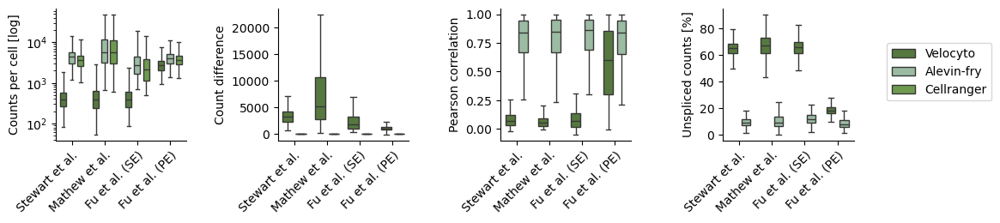

In [19]:
# set up figure

fig, axs = plt.subplots(1, 4, figsize=(12,2))

# 1a
plt.subplot(1,4,1)

sns.boxplot(x="Dataset", y="Counts", hue="Method", data=fig1a, 
            gap=0.3, legend=True, palette=["#548235", "#96C09F", "#6CA644"], 
            log_scale=True, showfliers=False, width=0.8)
plt.xlabel('')
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.ylabel("Counts per cell [log]")

plt.legend(bbox_to_anchor=(7.2,0.78))

# 1b
plt.subplot(1,4,2)

sns.boxplot(x="Dataset", y="Pct", hue="Method", data=fig1b, 
               gap=0.2, legend=False, palette=["#548235", "#96C09F"], showfliers=False)
plt.xlabel('')
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.ylabel("Count difference")

# 1c
plt.subplot(1,4,3)

sns.boxplot(x="Dataset", y="Pearson correlation", hue="Method", data=fig1c, 
               gap=0.3, legend=False, palette=["#548235", "#96C09F"], showfliers=False)
plt.xlabel('')
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.ylabel("Pearson correlation")
   
# 1d
plt.subplot(1,4,4)

sns.boxplot(x="Dataset", y="Pct", hue="Method", data=fig1d, 
               gap=0.3, legend=False, palette=["#548235", "#96C09F"], showfliers=False)
plt.xlabel('')
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.ylabel("Unspliced counts [%]")

sns.despine()
plt.subplots_adjust(wspace=0.7)

plt.savefig("figures/1.png", format="png", bbox_inches="tight", dpi=300)

## Figure 2

### Figure 2a: overlapping genes

In [72]:
# Stewart

# get overlapping genes
overlapping_genes_stewart = pd.read_pickle("../Stewart/data/stewart_overlapping_genes.pkl.gz", compression='gzip')

# subset: get only genes with mean expression >= 1
subset_stewart = overlapping_genes_stewart[overlapping_genes_stewart["mean counts cellranger"] >= 1]

# sort by relative overlap
subset_stewart.sort_values(by="rel_overlap", ascending=False, inplace=True)

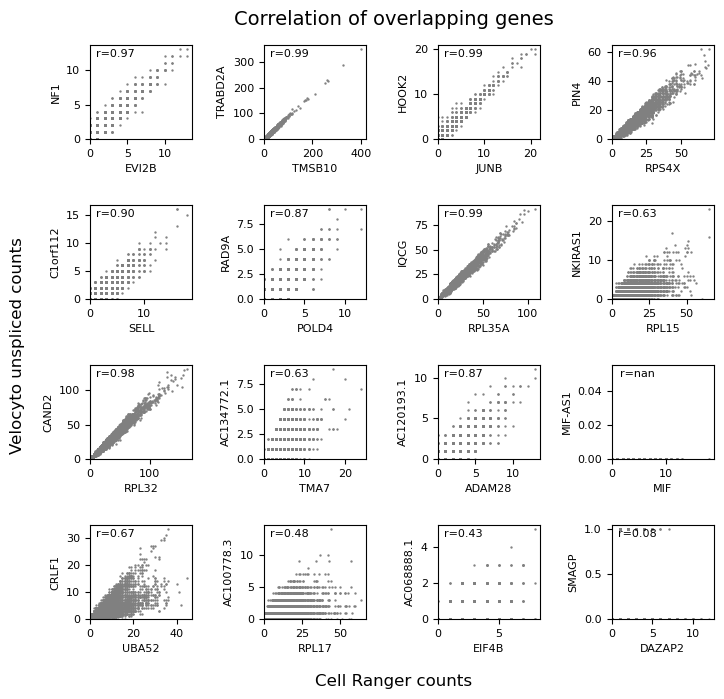

In [73]:
fig, axs = plt.subplots(4, 4, figsize=(8,7))
plt.suptitle("Correlation of overlapping genes", size=14)

for i in range(16):
    plt.subplot(4,4,i+1)

    gene_x = subset_stewart.index.get_level_values(0)[i]
    gene_y = subset_stewart.index.get_level_values(1)[i]
    x = stewart_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = stewart_velocyto[:,gene_y].layers["unspliced"].toarray().ravel()

    plt.scatter(x, y, s=0.5, c='grey')
    
    plt.xlabel(gene_x, size=8)
    plt.ylabel(gene_y, size=8)
    plt.xlim(left=0)
    plt.ylim(bottom=0)
    plt.tick_params(axis='x', labelsize=8)
    plt.tick_params(axis='y', labelsize=8)
    
    # calculate Pearson correlation
    corr, _ = pearsonr(x, y)

    # display Pearson correlation and overlap
    plt.text(0.25, 0.9, f"r={corr:.2f}", 
             size=8, ha='center', va='center', transform=plt.gca().transAxes);

fig.supxlabel("Cell Ranger counts", size=12)
fig.supylabel("Velocyto unspliced counts", size=12)

plt.subplots_adjust(top=0.93, left=0.12, bottom=0.11, hspace=0.7, wspace=0.7)
plt.savefig("figures/2a.png", format="png", bbox_inches="tight", dpi=300)

### Figure 2b: summary statistics of correlations

In [74]:
# get overlapping genes of Mathew and Fu

# Mathew

# get overlapping genes
overlapping_genes_mathew = pd.read_pickle("../Mathew/data/mathew_overlapping_genes.pkl.gz", compression='gzip')

# subset: get only genes with mean expression >= 1
subset_mathew = overlapping_genes_mathew[overlapping_genes_mathew["mean counts cellranger"] >= 1]

# sort by relative overlap
subset_mathew.sort_values(by="rel_overlap", ascending=False, inplace=True)

# Fu

# get overlapping genes
overlapping_genes_fu = pd.read_pickle("../Fu/data/fu_overlapping_genes.pkl.gz", compression='gzip')

# subset: get only genes with mean expression >= 1
subset_fu = overlapping_genes_fu[overlapping_genes_fu["mean counts cellranger"] >= 1]

# sort by relative overlap
subset_fu.sort_values(by="rel_overlap", ascending=False, inplace=True)

In [75]:
# get Pearson correlations
corr_stewart, corr_mathew, corr_fu, corr_fu_se, corr_fu_pe = [], [], [], [], []

# Stewart
for i in range(len(subset_stewart)):
    gene_x = subset_stewart.index.get_level_values(0)[i]
    gene_y = subset_stewart.index.get_level_values(1)[i]
    x = stewart_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = stewart_velocyto[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_stewart.append(corr)

# Mathew
for i in range(len(subset_mathew)):
    gene_x = subset_mathew.index.get_level_values(0)[i]
    gene_y = subset_mathew.index.get_level_values(1)[i]
    x = mathew_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = mathew_velocyto[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_mathew.append(corr)

# Fu 
for i in range(len(subset_fu)):
    gene_x = subset_fu.index.get_level_values(0)[i]
    gene_y = subset_fu.index.get_level_values(1)[i]
    x = fu_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = fu_velocyto[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_fu.append(corr)

# Fu SE
for i in range(len(subset_fu)):
    gene_x = subset_fu.index.get_level_values(0)[i]
    gene_y = subset_fu.index.get_level_values(1)[i]
    x = fu_se_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = fu_se_velocyto[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_fu_se.append(corr)

# Fu PE
for i in range(len(subset_fu)):
    gene_x = subset_fu.index.get_level_values(0)[i]
    gene_y = subset_fu.index.get_level_values(1)[i]
    x = fu_pe_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = fu_pe_velocyto[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_fu_pe.append(corr)

In [76]:
# get subsets with relative overlap > 60%
subset_stewart_2 = subset_stewart[subset_stewart["rel_overlap"] >= 0.6]
subset_mathew_2 = subset_mathew[subset_mathew["rel_overlap"] >= 0.6]
subset_fu_2 = subset_fu[subset_fu["rel_overlap"] >= 0.6]

In [77]:
# get Pearson correlations of subsets
corr_stewart_2, corr_mathew_2, corr_fu_2, corr_fu_se_2, corr_fu_pe_2 = [], [], [], [], []

# Stewart
for i in range(len(subset_stewart_2)):
    gene_x = subset_stewart_2.index.get_level_values(0)[i]
    gene_y = subset_stewart_2.index.get_level_values(1)[i]
    x = stewart_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = stewart_velocyto[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_stewart_2.append(corr)

# Mathew
for i in range(len(subset_mathew_2)):
    gene_x = subset_mathew_2.index.get_level_values(0)[i]
    gene_y = subset_mathew_2.index.get_level_values(1)[i]
    x = mathew_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = mathew_velocyto[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_mathew_2.append(corr)

# Fu
for i in range(len(subset_fu_2)):
    gene_x = subset_fu_2.index.get_level_values(0)[i]
    gene_y = subset_fu_2.index.get_level_values(1)[i]
    x = fu_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = fu_velocyto[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_fu_2.append(corr)

# Fu (SE)
for i in range(len(subset_fu_2)):
    gene_x = subset_fu_2.index.get_level_values(0)[i]
    gene_y = subset_fu_2.index.get_level_values(1)[i]
    x = fu_se_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = fu_se_velocyto[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_fu_se_2.append(corr)

# Fu (PE)
for i in range(len(subset_fu_2)):
    gene_x = subset_fu_2.index.get_level_values(0)[i]
    gene_y = subset_fu_2.index.get_level_values(1)[i]
    x = fu_pe_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = fu_pe_velocyto[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_fu_pe_2.append(corr)

In [78]:
# get subsets with relative overlap > 80%
subset_stewart_3 = subset_stewart[subset_stewart["rel_overlap"] >= 0.8]
subset_mathew_3 = subset_mathew[subset_mathew["rel_overlap"] >= 0.8]
subset_fu_3 = subset_fu[subset_fu["rel_overlap"] >= 0.8]

In [79]:
# get Pearson correlations of subsets
corr_stewart_3, corr_mathew_3, corr_fu_3, corr_fu_se_3, corr_fu_pe_3 = [], [], [], [], []

# Stewart
for i in range(len(subset_stewart_3)):
    gene_x = subset_stewart_3.index.get_level_values(0)[i]
    gene_y = subset_stewart_3.index.get_level_values(1)[i]
    x = stewart_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = stewart_velocyto[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_stewart_3.append(corr)

# Mathew
for i in range(len(subset_mathew_3)):
    gene_x = subset_mathew_3.index.get_level_values(0)[i]
    gene_y = subset_mathew_3.index.get_level_values(1)[i]
    x = mathew_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = mathew_velocyto[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_mathew_3.append(corr)

# Fu
for i in range(len(subset_fu_3)):
    gene_x = subset_fu_3.index.get_level_values(0)[i]
    gene_y = subset_fu_3.index.get_level_values(1)[i]
    x = fu_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = fu_velocyto[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_fu_3.append(corr)

# Fu (SE)
for i in range(len(subset_fu_3)):
    gene_x = subset_fu_3.index.get_level_values(0)[i]
    gene_y = subset_fu_3.index.get_level_values(1)[i]
    x = fu_se_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = fu_se_velocyto[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_fu_se_3.append(corr)

# Fu (PE)
for i in range(len(subset_fu_3)):
    gene_x = subset_fu_3.index.get_level_values(0)[i]
    gene_y = subset_fu_3.index.get_level_values(1)[i]
    x = fu_pe_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = fu_pe_velocyto[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_fu_pe_3.append(corr)

In [80]:
# create dataframe to plot

fig2b = pd.DataFrame({"Pearson correlation": np.concatenate([corr_stewart, corr_stewart_2, corr_stewart_3,
                                                             corr_mathew, corr_mathew_2, corr_mathew_3,
                                                             corr_fu_se, corr_fu_se_2, corr_fu_se_3,
                                                             corr_fu_pe, corr_fu_pe_2, corr_fu_pe_3]),
                      "Subset": np.concatenate([["All genes"] * len(subset_stewart), [">60% overlap"] * len(subset_stewart_2), [">80% overlap"] * len(subset_stewart_3),
                                                ["All genes"] * len(subset_mathew), [">60% overlap"] * len(subset_mathew_2), [">80% overlap"] * len(subset_mathew_3),
                                                ["All genes"] * len(subset_fu), [">60% overlap"] * len(subset_fu_2), [">80% overlap"] * len(subset_fu_3),
                                                ["All genes"] * len(subset_fu), [">60% overlap"] * len(subset_fu_2), [">80% overlap"] * len(subset_fu_3)]),
                      "Dataset": np.concatenate([["Stewart et al."] * (len(subset_stewart) + len(subset_stewart_2) + len(subset_stewart_3)),
                                                 ["Mathew et al."] * (len(subset_mathew) + len(subset_mathew_2) + len(subset_mathew_3)),
                                                 ["Fu et al. (SE)"] * (len(subset_fu) + len(subset_fu_2) + len(subset_fu_3)),
                                                 ["Fu et al. (PE)"] * (len(subset_fu) + len(subset_fu_2) + len(subset_fu_3))])})

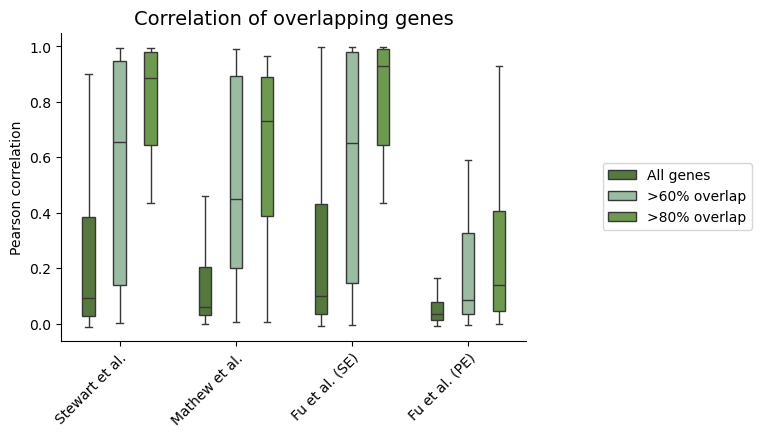

In [136]:
# Figure 2B: summary of correlations of overlapping gene counts

# set up figure
fig, axs = plt.subplots(1, 1, figsize=(6,4))
plt.title("Correlation of overlapping genes", size=14)
sns.boxplot(x="Dataset", y="Pearson correlation", hue="Subset", data=fig2b, 
               gap=0.6, showfliers=False, palette=["#548235", "#96C09F", "#6CA644"])
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.legend(bbox_to_anchor=(1.5,0.6))
plt.xlabel("")

sns.despine()
plt.savefig("figures/2b.png", format="png", bbox_inches="tight", dpi=300)

## Supplement 1: overlapping genes Mathew

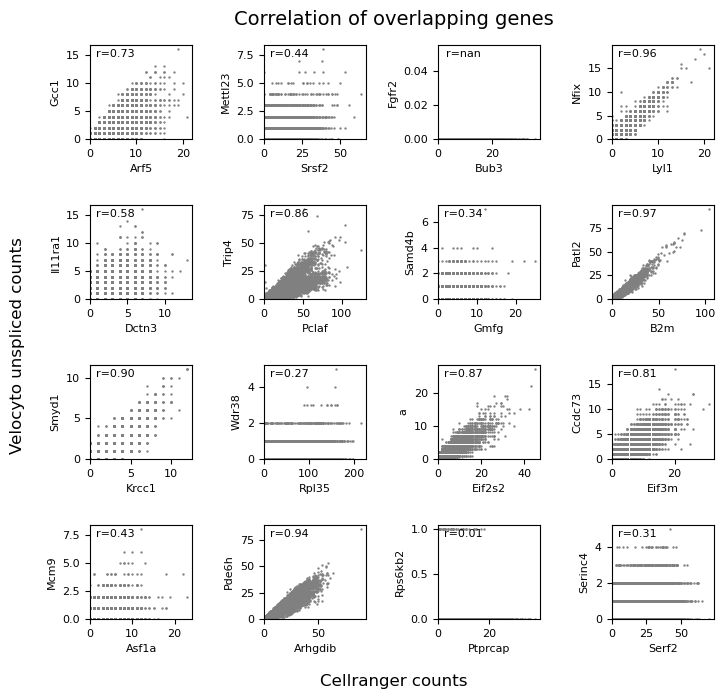

In [82]:
fig, axs = plt.subplots(4, 4, figsize=(8,7))
plt.suptitle("Correlation of overlapping genes", size=14)

for i in range(16):
    plt.subplot(4,4,i+1)

    gene_x = subset_mathew.index.get_level_values(0)[i]
    gene_y = subset_mathew.index.get_level_values(1)[i]
    x = mathew_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = mathew_velocyto[:,gene_y].layers["unspliced"].toarray().ravel()

    plt.scatter(x, y, s=0.5, c='grey')
    
    plt.xlabel(gene_x, size=8)
    plt.ylabel(gene_y, size=8)
    plt.xlim(left=0)
    plt.ylim(bottom=0)
    plt.tick_params(axis='x', labelsize=8)
    plt.tick_params(axis='y', labelsize=8)
    
    # calculate Pearson correlation
    corr, _ = pearsonr(x, y)

    # display Pearson correlation and overlap
    plt.text(0.25, 0.9, f"r={corr:.2f}", 
             size=8, ha='center', va='center', transform=plt.gca().transAxes);

fig.supxlabel("Cellranger counts", size=12)
fig.supylabel("Velocyto unspliced counts", size=12)

plt.subplots_adjust(top=0.93, left=0.12, bottom=0.11, hspace=0.7, wspace=0.7)
plt.savefig("figures/supplement_1.png", format="png", bbox_inches="tight", dpi=300)

## Supplement 2: overlapping genes Fu SE

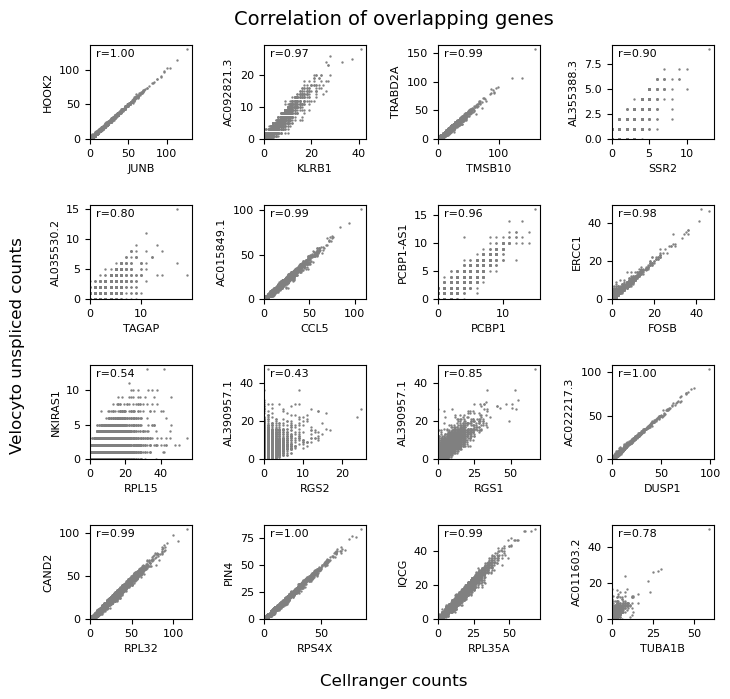

In [83]:
fig, axs = plt.subplots(4, 4, figsize=(8,7))
plt.suptitle("Correlation of overlapping genes", size=14)

for i in range(16):
    plt.subplot(4,4,i+1)

    gene_x = subset_fu.index.get_level_values(0)[i]
    gene_y = subset_fu.index.get_level_values(1)[i]
    x = fu_se_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = fu_se_velocyto[:,gene_y].layers["unspliced"].toarray().ravel()

    plt.scatter(x, y, s=0.5, c='grey')
    
    plt.xlabel(gene_x, size=8)
    plt.ylabel(gene_y, size=8)
    plt.xlim(left=0)
    plt.ylim(bottom=0)
    plt.tick_params(axis='x', labelsize=8)
    plt.tick_params(axis='y', labelsize=8)
    
    # calculate Pearson correlation
    corr, _ = pearsonr(x, y)

    # display Pearson correlation and overlap
    plt.text(0.25, 0.9, f"r={corr:.2f}", 
             size=8, ha='center', va='center', transform=plt.gca().transAxes);

fig.supxlabel("Cellranger counts", size=12)
fig.supylabel("Velocyto unspliced counts", size=12)

plt.subplots_adjust(top=0.93, left=0.12, bottom=0.11, hspace=0.7, wspace=0.7)
plt.savefig("figures/supplement_2.png", format="png", bbox_inches="tight", dpi=300)

## Supplement 3: co-expression

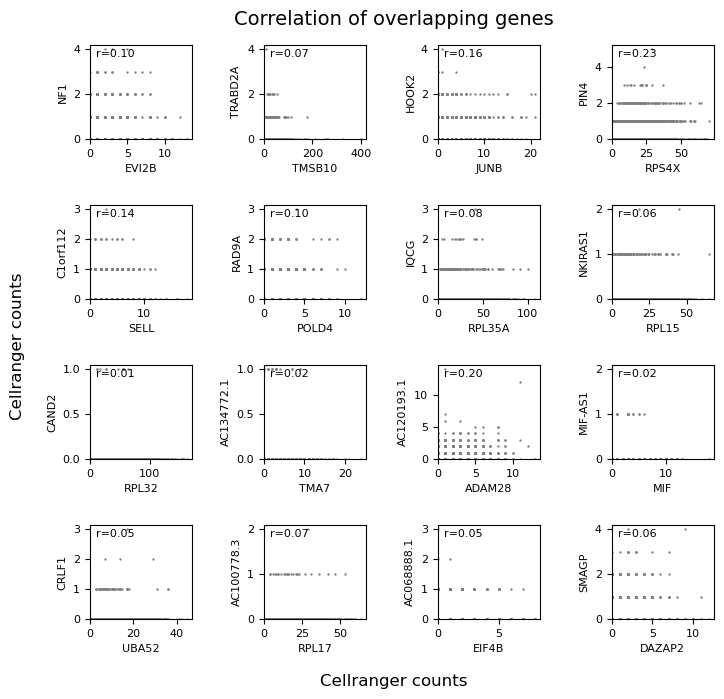

In [84]:
fig, axs = plt.subplots(4, 4, figsize=(8,7))
plt.suptitle("Correlation of overlapping genes", size=14)

for i in range(16):
    plt.subplot(4,4,i+1)

    gene_x = subset_stewart.index.get_level_values(0)[i]
    gene_y = subset_stewart.index.get_level_values(1)[i]
    x = stewart_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = stewart_velocyto[:,gene_y].layers["counts"].toarray().ravel()

    plt.scatter(x, y, s=0.5, c='grey')
    
    plt.xlabel(gene_x, size=8)
    plt.ylabel(gene_y, size=8)
    plt.xlim(left=0)
    plt.ylim(bottom=0)
    plt.tick_params(axis='x', labelsize=8)
    plt.tick_params(axis='y', labelsize=8)
    
    # calculate Pearson correlation
    corr, _ = pearsonr(x, y)

    # display Pearson correlation and overlap
    plt.text(0.25, 0.9, f"r={corr:.2f}", 
             size=8, ha='center', va='center', transform=plt.gca().transAxes);

fig.supxlabel("Cellranger counts", size=12)
fig.supylabel("Cellranger counts", size=12)

plt.subplots_adjust(top=0.93, left=0.12, bottom=0.11, hspace=0.7, wspace=0.7)
plt.savefig("figures/supplement_3.png", format="png", bbox_inches="tight", dpi=300)

## Supplement 4

### Supplement 4a: correlation in alevin-fry

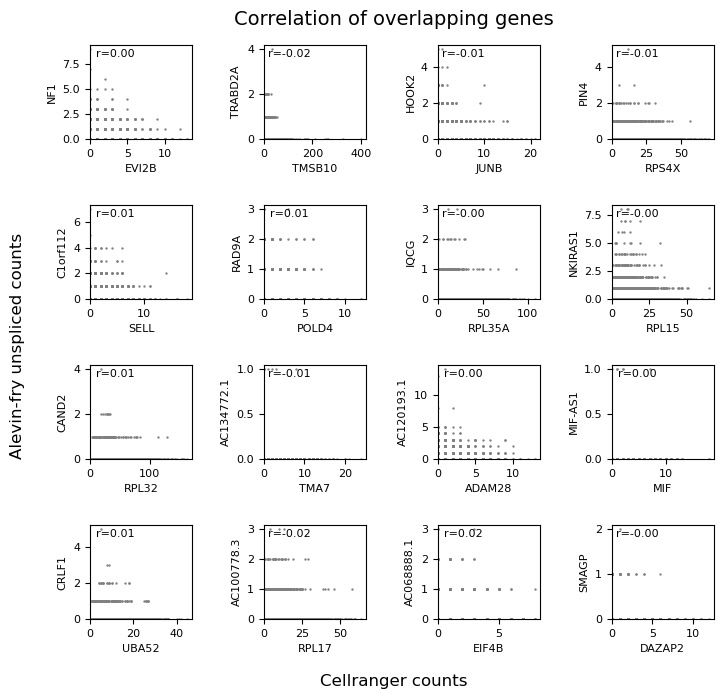

In [85]:
fig, axs = plt.subplots(4, 4, figsize=(8,7))
plt.suptitle("Correlation of overlapping genes", size=14)

for i in range(16):
    plt.subplot(4,4,i+1)

    gene_x = subset_stewart.index.get_level_values(0)[i]
    gene_y = subset_stewart.index.get_level_values(1)[i]
    x = stewart_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = stewart_alevin[:,gene_y].layers["unspliced"].toarray().ravel()

    plt.scatter(x, y, s=0.5, c='grey')
    
    plt.xlabel(gene_x, size=8)
    plt.ylabel(gene_y, size=8)
    plt.xlim(left=0)
    plt.ylim(bottom=0)
    plt.tick_params(axis='x', labelsize=8)
    plt.tick_params(axis='y', labelsize=8)
    
    # calculate Pearson correlation
    corr, _ = pearsonr(x, y)

    # display Pearson correlation and overlap
    plt.text(0.25, 0.9, f"r={corr:.2f}", 
             size=8, ha='center', va='center', transform=plt.gca().transAxes);

fig.supxlabel("Cellranger counts", size=12)
fig.supylabel("Alevin-fry unspliced counts", size=12)

plt.subplots_adjust(top=0.93, left=0.12, bottom=0.11, hspace=0.7, wspace=0.7)
plt.savefig("figures/supplement_4a.png", format="png", bbox_inches="tight", dpi=300)

### Supplement 4b: summary statistics of correlations in alevin-fry

In [86]:
# get Pearson correlations
corr_stewart_alevin, corr_mathew_alevin, corr_fu_se_alevin, corr_fu_pe_alevin = [], [], [], []

# Stewart
for i in range(len(subset_stewart)):
    gene_x = subset_stewart.index.get_level_values(0)[i]
    gene_y = subset_stewart.index.get_level_values(1)[i]
    x = stewart_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = stewart_alevin[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_stewart_alevin.append(corr)

# Mathew
for i in range(len(subset_mathew)):
    gene_x = subset_mathew.index.get_level_values(0)[i]
    gene_y = subset_mathew.index.get_level_values(1)[i]
    x = mathew_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = mathew_alevin[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_mathew_alevin.append(corr)

# Fu SE
for i in range(len(subset_fu)):
    gene_x = subset_fu.index.get_level_values(0)[i]
    gene_y = subset_fu.index.get_level_values(1)[i]
    x = fu_se_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = fu_se_alevin[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_fu_se_alevin.append(corr)

# Fu PE
for i in range(len(subset_fu)):
    gene_x = subset_fu.index.get_level_values(0)[i]
    gene_y = subset_fu.index.get_level_values(1)[i]
    x = fu_pe_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = fu_pe_alevin[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_fu_pe_alevin.append(corr)

In [87]:
# get Pearson correlations of subsets
corr_stewart_alevin_2, corr_mathew_alevin_2, corr_fu_se_alevin_2, corr_fu_pe_alevin_2 = [], [], [], []

# Stewart
for i in range(len(subset_stewart_2)):
    gene_x = subset_stewart_2.index.get_level_values(0)[i]
    gene_y = subset_stewart_2.index.get_level_values(1)[i]
    x = stewart_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = stewart_alevin[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_stewart_alevin_2.append(corr)

# Mathew
for i in range(len(subset_mathew_2)):
    gene_x = subset_mathew_2.index.get_level_values(0)[i]
    gene_y = subset_mathew_2.index.get_level_values(1)[i]
    x = mathew_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = mathew_alevin[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_mathew_alevin_2.append(corr)

# Fu (SE)
for i in range(len(subset_fu_2)):
    gene_x = subset_fu_2.index.get_level_values(0)[i]
    gene_y = subset_fu_2.index.get_level_values(1)[i]
    x = fu_se_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = fu_se_alevin[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_fu_se_alevin_2.append(corr)

# Fu (PE)
for i in range(len(subset_fu_2)):
    gene_x = subset_fu_2.index.get_level_values(0)[i]
    gene_y = subset_fu_2.index.get_level_values(1)[i]
    x = fu_pe_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = fu_pe_alevin[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_fu_pe_alevin_2.append(corr)

In [88]:
# get Pearson correlations of subsets
corr_stewart_alevin_3, corr_mathew_alevin_3, corr_fu_se_alevin_3, corr_fu_pe_alevin_3 = [], [], [], []

# Stewart
for i in range(len(subset_stewart_3)):
    gene_x = subset_stewart_3.index.get_level_values(0)[i]
    gene_y = subset_stewart_3.index.get_level_values(1)[i]
    x = stewart_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = stewart_alevin[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_stewart_alevin_3.append(corr)

# Mathew
for i in range(len(subset_mathew_3)):
    gene_x = subset_mathew_3.index.get_level_values(0)[i]
    gene_y = subset_mathew_3.index.get_level_values(1)[i]
    x = mathew_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = mathew_alevin[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_mathew_alevin_3.append(corr)

# Fu (SE)
for i in range(len(subset_fu_3)):
    gene_x = subset_fu_3.index.get_level_values(0)[i]
    gene_y = subset_fu_3.index.get_level_values(1)[i]
    x = fu_se_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = fu_se_alevin[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_fu_se_alevin_3.append(corr)

# Fu (PE)
for i in range(len(subset_fu_3)):
    gene_x = subset_fu_3.index.get_level_values(0)[i]
    gene_y = subset_fu_3.index.get_level_values(1)[i]
    x = fu_pe_velocyto[:,gene_x].layers["counts"].toarray().ravel()
    y = fu_pe_alevin[:,gene_y].layers["unspliced"].toarray().ravel()
    corr, _ = pearsonr(x, y)
    corr_fu_pe_alevin_3.append(corr)

In [89]:
# create dataframe to plot

sup4b = pd.DataFrame({"Pearson correlation": np.concatenate([corr_stewart_alevin, corr_stewart_alevin_2, corr_stewart_alevin_3,
                                                             corr_mathew_alevin, corr_mathew_alevin_2, corr_mathew_alevin_3,
                                                             corr_fu_se_alevin, corr_fu_se_alevin_2, corr_fu_se_alevin_3,
                                                             corr_fu_pe_alevin, corr_fu_pe_alevin_2, corr_fu_pe_alevin_3]),
                      "Subset": np.concatenate([["All genes"] * len(subset_stewart), [">60% overlap"] * len(subset_stewart_2), [">80% overlap"] * len(subset_stewart_3),
                                                ["All genes"] * len(subset_mathew), [">60% overlap"] * len(subset_mathew_2), [">80% overlap"] * len(subset_mathew_3),
                                                ["All genes"] * len(subset_fu), [">60% overlap"] * len(subset_fu_2), [">80% overlap"] * len(subset_fu_3),
                                                ["All genes"] * len(subset_fu), [">60% overlap"] * len(subset_fu_2), [">80% overlap"] * len(subset_fu_3)]),
                      "Dataset": np.concatenate([["Stewart et al."] * (len(subset_stewart) + len(subset_stewart_2) + len(subset_stewart_3)),
                                                 ["Mathew et al."] * (len(subset_mathew) + len(subset_mathew_2) + len(subset_mathew_3)),
                                                 ["Fu et al. (SE)"] * (len(subset_fu) + len(subset_fu_2) + len(subset_fu_3)),
                                                 ["Fu et al. (PE)"] * (len(subset_fu) + len(subset_fu_2) + len(subset_fu_3))])})

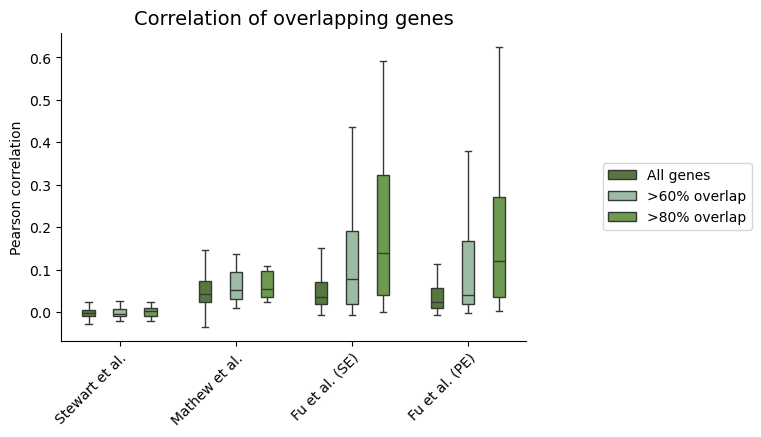

In [137]:
# Figure S4B: summary of correlations of overlapping gene counts

# set up figure
fig, axs = plt.subplots(1, 1, figsize=(6,4))
plt.title("Correlation of overlapping genes", size=14)
sns.boxplot(x="Dataset", y="Pearson correlation", hue="Subset", data=sup4b, 
               gap=0.6, showfliers=False, palette=["#548235", "#96C09F", "#6CA644"])
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.legend(bbox_to_anchor=(1.5,0.6))
plt.xlabel("")

sns.despine()
plt.savefig("figures/supplement_4b.png", format="png", bbox_inches="tight", dpi=300)

## Supplement 5

### Supplement 5a: coorelation of spliced counts: MIF (overlaps with exon only)

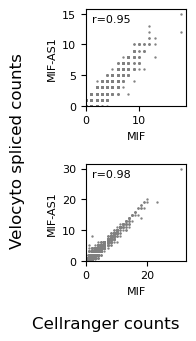

In [91]:
fig, axs = plt.subplots(2, 1, figsize=(2,3.7))

# Stewart
plt.subplot(2,1,1)
    
x = stewart_velocyto[:,"MIF"].layers["counts"].toarray().ravel()
y = stewart_velocyto[:,"MIF-AS1"].layers["spliced"].toarray().ravel()

plt.scatter(x, y, s=0.5, c='grey')
    
plt.xlabel("MIF", size=8)
plt.ylabel("MIF-AS1", size=8)
plt.xlim(left=0)
plt.ylim(bottom=0)
plt.tick_params(axis='x', labelsize=8)
plt.tick_params(axis='y', labelsize=8)
    
# calculate Pearson correlation
corr, _ = pearsonr(x, y)

# display Pearson correlation
plt.text(0.25, 0.9, f"r={corr:.2f}", size=8, ha='center', va='center', transform=plt.gca().transAxes)

# Fu
plt.subplot(2,1,2)
    
x = fu_se_velocyto[:,"MIF"].layers["counts"].toarray().ravel()
y = fu_se_velocyto[:,"MIF-AS1"].layers["spliced"].toarray().ravel()

plt.scatter(x, y, s=0.5, c='grey')
    
plt.xlabel("MIF", size=8)
plt.ylabel("MIF-AS1", size=8)
plt.xlim(left=0)
plt.ylim(bottom=0)
plt.tick_params(axis='x', labelsize=8)
plt.tick_params(axis='y', labelsize=8)
    
# calculate Pearson correlation
corr, _ = pearsonr(x, y)

# display Pearson correlation
plt.text(0.25, 0.9, f"r={corr:.2f}", size=8, ha='center', va='center', transform=plt.gca().transAxes)

fig.supxlabel("Cellranger counts", size=12)
fig.supylabel("Velocyto spliced counts", size=12)

plt.subplots_adjust(left=0.4, hspace=0.6, bottom=0.2)
plt.savefig("figures/supplement_5a.png", format="png", bbox_inches="tight", dpi=300)

## Figure 3

### Figure 3a: Velocity gene overlaps

In [92]:
# get overlap
velocity_genes = pd.DataFrame({"velocyto": [np.sum(stewart_velocyto_sto.var["velocity_genes"]),
                                            np.sum(mathew_velocyto_sto.var["velocity_genes"]),
                                            np.sum(fu_velocyto_sto.var["velocity_genes"])],
                               "alevin": [np.sum(stewart_alevin_sto.var["velocity_genes"]),
                                          np.sum(mathew_alevin_sto.var["velocity_genes"]),
                                          np.sum(fu_alevin_sto.var["velocity_genes"])],
                               "overlap": [len(set(stewart_velocyto_sto[:,stewart_velocyto_sto.var["velocity_genes"] == True].var_names) & 
                                               set(stewart_alevin_sto[:,stewart_alevin_sto.var["velocity_genes"] == True].var_names)),
                                           len(set(mathew_velocyto_sto[:,mathew_velocyto_sto.var["velocity_genes"] == True].var_names) & 
                                               set(mathew_alevin_sto[:,mathew_alevin_sto.var["velocity_genes"] == True].var_names)),
                                           len(set(fu_velocyto_sto[:,fu_velocyto_sto.var["velocity_genes"] == True].var_names) & 
                                               set(fu_alevin_sto[:,fu_alevin_sto.var["velocity_genes"] == True].var_names))]},
                              index = ["Stewart et al.", "Mathew et al.", "Fu et al."])                                

In [93]:
velocity_genes

,velocyto,alevin,overlap
Stewart et al.,47,223,23
Mathew et al.,127,786,103
Fu et al.,225,448,152


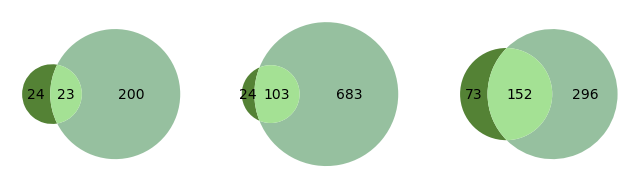

In [94]:
# set up figure
fig, axs = plt.subplots(1, 3, figsize=(8,4))

plt.subplot(1,3,1)
out = venn2(subsets = (24, 200, 23), set_colors=["#548235", "#96C09F"], set_labels=["",""], alpha=1)
for text in out.subset_labels:
   text.set_fontsize(10)
plt.ylabel("Stewart et al.")

plt.subplot(1,3,2)
out = venn2(subsets = (24, 683, 103), set_colors=["#548235", "#96C09F"], set_labels=["",""], alpha=1)
for text in out.subset_labels:
   text.set_fontsize(10)
plt.ylabel("Mathew et al.")

plt.subplot(1,3,3)
out = venn2(subsets = (73, 296, 152), set_colors=["#548235", "#96C09F"], set_labels=["",""], alpha=1)
for text in out.subset_labels:
   text.set_fontsize(10)
plt.ylabel("Fu et al.")

plt.savefig("figures/3a.png", format="png", bbox_inches="tight", dpi=300)

### Figure 3b: phase plots of marker genes

#### determine 5% and 95% percentiles to color datapoints used for steady-state ratio calculation

In [95]:
# Stewart

# velocyto
lr = LinearRegression(fit_intercept=False, percentile=[5, 95])
n_obs, x, y = lr._trim_data(data=[stewart_velocyto_sto[:,"TCL1A"].layers["Ms"], stewart_velocyto_sto[:,"TCL1A"].layers["Mu"]])

velo_quantiles = [i for i in range(stewart_velocyto_sto.n_obs) if i in np.nonzero(x.toarray())[0] or i in np.nonzero(y.toarray())[0]]

lr.fit(x,y)
print(lr.coef_)

# alevin
lr = LinearRegression(fit_intercept=False, percentile=[5, 95])
n_obs, x, y = lr._trim_data(data=[stewart_alevin_sto[:,"TCL1A"].layers["Ms"], stewart_alevin_sto[:,"TCL1A"].layers["Mu"]])

alevin_quantiles = [i for i in range(stewart_alevin_sto.n_obs) if i in np.nonzero(x.toarray())[0] or i in np.nonzero(y.toarray())[0]]

lr.fit(x,y)
print(lr.coef_)

stewart_velocyto_sto.obs["extreme_quantile"] = ["Both" if i in velo_quantiles and i in alevin_quantiles
                                                else "Velocyto" if i in velo_quantiles
                                                else "Alevin-fry" if i in alevin_quantiles
                                                else "None" for i in range(stewart_velocyto_sto.n_obs)]
stewart_alevin_sto.obs["extreme_quantile"] = stewart_velocyto_sto.obs["extreme_quantile"]

[0.6718033]
[0.01309846]


In [96]:
# Mathew

# velocyto
lr = LinearRegression(fit_intercept=False, percentile=[5, 95])
n_obs, x, y = lr._trim_data(data=[mathew_velocyto_sto[:,"Mki67"].layers["Ms"], mathew_velocyto_sto[:,"Mki67"].layers["Mu"]])

velo_quantiles = [i for i in range(mathew_velocyto_sto.n_obs) if (i in np.nonzero(x.toarray())[0] or i in np.nonzero(y.toarray())[0])]

lr.fit(x,y)
print(lr.coef_)

# alevin
lr = LinearRegression(fit_intercept=False, percentile=[5, 95])
n_obs, x, y = lr._trim_data(data=[mathew_alevin_sto[:,"Mki67"].layers["Ms"], mathew_alevin_sto[:,"Mki67"].layers["Mu"]])
alevin_quantiles = [i for i in range(mathew_alevin_sto.n_obs) if (i in np.nonzero(x.toarray())[0] or i in np.nonzero(y.toarray())[0])]

lr.fit(x,y)
print(lr.coef_)

mathew_velocyto_sto.obs["extreme_quantile"] = ["Both" if i in velo_quantiles and i in alevin_quantiles
                                                else "Velocyto" if i in velo_quantiles
                                                else "Alevin-fry" if i in alevin_quantiles
                                                else "None" for i in range(mathew_velocyto_sto.n_obs)]
mathew_alevin_sto.obs["extreme_quantile"] = mathew_velocyto_sto.obs["extreme_quantile"]

[0.07841014]
[0.01738824]


In [97]:
# Fu

# velocyto
lr = LinearRegression(fit_intercept=False, percentile=[5, 95])
n_obs, x, y = lr._trim_data(data=[fu_velocyto_sto[:,"TBX21"].layers["Ms"], fu_velocyto_sto[:,"TBX21"].layers["Mu"]])

velo_quantiles = [i for i in range(fu_velocyto_sto.n_obs) if i in np.nonzero(x.toarray())[0] or i in np.nonzero(y.toarray())[0]]

lr.fit(x,y)
print(lr.coef_)

# alevin
lr = LinearRegression(fit_intercept=False, percentile=[5, 95])
n_obs, x, y = lr._trim_data(data=[fu_alevin_sto[:,"TBX21"].layers["Ms"], fu_alevin_sto[:,"TBX21"].layers["Mu"]])
alevin_quantiles = [i for i in range(fu_alevin_sto.n_obs) if i in np.nonzero(x.toarray())[0] or i in np.nonzero(y.toarray())[0]]

lr.fit(x,y)
print(lr.coef_)

fu_velocyto_sto.obs["extreme_quantile"] = ["Both" if i in velo_quantiles and i in alevin_quantiles
                                            else "Velocyto" if i in velo_quantiles
                                            else "Alevin-fry" if i in alevin_quantiles
                                            else "None" for i in range(fu_velocyto_sto.n_obs)]
fu_alevin_sto.obs["extreme_quantile"] = fu_velocyto_sto.obs["extreme_quantile"]

[0.04017194]
[0.02891647]


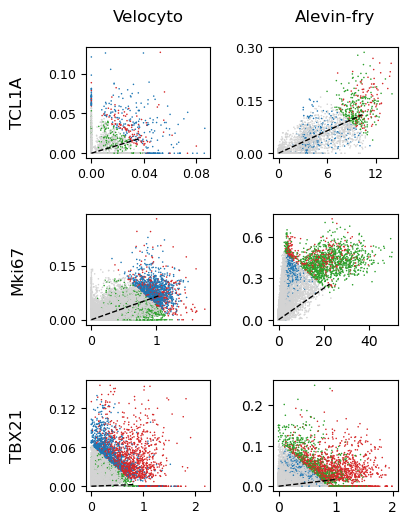

In [138]:
# figure 3b: phase plots of marker genes

# set up figure
fig, axs = plt.subplots(3, 2, figsize=(4,6))

# Stewart

scv.pl.scatter(stewart_velocyto_sto, 'TCL1A', color="extreme_quantile",
               palette= {"Both": "#d62728", "Velocyto": "#1f77b4", "Alevin-fry": "#2ca02c", "None": "lightgrey"}, cmap="coolwarm", 
               ax=axs[0][0], show=False, figsize=(3,3), xlabel="", ylabel="TCL1A\n", title="Velocyto\n", size=5, fontsize=12)
axs[0][0].get_legend().remove()

scv.pl.scatter(stewart_alevin_sto, 'TCL1A', color="extreme_quantile",
               palette= {"Both": "#d62728", "Velocyto": "#1f77b4", "Alevin-fry": "#2ca02c", "None": "lightgrey"}, cmap="coolwarm",
               ax=axs[0][1], show=False, figsize=(3,3), xlabel="", ylabel="", title="Alevin-fry\n", size=5, fontsize=12)
axs[0][1].get_legend().remove()

# Mathew

scv.pl.scatter(mathew_velocyto_sto, 'Mki67', color="extreme_quantile",
               palette= {"Both": "#d62728", "Velocyto": "#1f77b4", "Alevin-fry": "#2ca02c", "None": "lightgrey"}, cmap="coolwarm", 
               ax=axs[1][0], show=False, figsize=(3,3), xlabel="", ylabel="Mki67\n", title="", size=5, fontsize=12)
axs[1][0].get_legend().remove()

scv.pl.scatter(mathew_alevin_sto, 'Mki67', color="extreme_quantile",
               palette= {"Both": "#d62728", "Velocyto": "#1f77b4", "Alevin-fry": "#2ca02c", "None": "lightgrey"}, cmap="coolwarm",
               ax=axs[1][1], show=False, figsize=(3,3), xlabel="", ylabel="", title="", size=5)
axs[1][1].get_legend().remove()

#Fu

scv.pl.scatter(fu_velocyto_sto, 'TBX21', color="extreme_quantile",
               palette= {"Both": "#d62728", "Velocyto": "#1f77b4", "Alevin-fry": "#2ca02c", "None": "lightgrey"}, cmap="coolwarm",
               ax=axs[2][0], show=False, figsize=(3,3), xlabel="", ylabel="TBX21\n", title="", size=5, fontsize=12)
axs[2][0].get_legend().remove()

scv.pl.scatter(fu_alevin_sto, 'TBX21', color="extreme_quantile",
               palette= {"Both": "#d62728", "Velocyto": "#1f77b4", "Alevin-fry": "#2ca02c", "None": "lightgrey"}, cmap="coolwarm",
               ax=axs[2][1], show=False, figsize=(3,3), xlabel="", ylabel="", title="", size=5)
axs[2][1].get_legend().remove()

# adjust spacing and save
plt.subplots_adjust(wspace=0.5, hspace=0.5, left=0.12, top=0.85)
plt.savefig("figures/3_b.png", format="png", bbox_inches="tight", dpi=300)

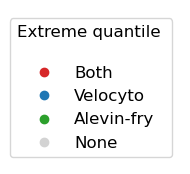

In [99]:
# add legend
fig, ax = plt.subplots(figsize=(2,2))

line1, = ax.plot([], [], marker="o", linestyle='None', color="#d62728", label='Both')
line2, = ax.plot([], [], marker="o", linestyle='None',  color="#1f77b4", label='Velocyto')
line3, = ax.plot([], [], marker="o", linestyle='None', color="#2ca02c", label='Alevin-fry')
line4, = ax.plot([], [], marker="o", linestyle='None', color="lightgrey", label='None')

ax.legend(title="Extreme quantile \n", title_fontsize=12, fontsize=12)
ax.set_axis_off()

plt.savefig("figures/3_b_legend.png", format="png", bbox_inches="tight", dpi=300)

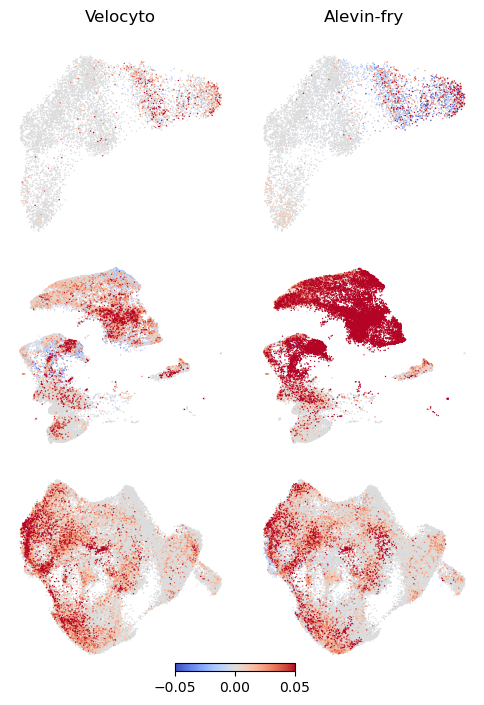

In [100]:
# figure 3c: velocities of marker genes

# set up figure
fig, axs = plt.subplots(3, 2, figsize=(6,8))

# Stewart

scv.pl.scatter(stewart_velocyto_sto, layer="velocity", color='TCL1A', size=4, vmin=-0.05, vmax=0.05, 
                cmap="coolwarm", ax=axs[0][0], show=False, figsize=(3,3), title="Velocyto\n", colorbar=False, fontsize=12)

scv.pl.scatter(stewart_alevin_sto, layer="velocity", color='TCL1A', size=4, vmin=-0.05, vmax=0.05,
                cmap="coolwarm", ax=axs[0][1], show=False, figsize=(3,3), title="Alevin-fry\n", colorbar=False, fontsize=12)

# Mathew

scv.pl.scatter(mathew_velocyto_sto, layer="velocity", color='Mki67', size=4, vmin=-0.05, vmax=0.05, 
                cmap="coolwarm", ax=axs[1][0], show=False, figsize=(3,3), title="", colorbar=False)

scv.pl.scatter(mathew_alevin_sto, layer="velocity", color='Mki67', size=4, vmin=-0.05, vmax=0.05,
                cmap="coolwarm", ax=axs[1][1], show=False, figsize=(3,3), title="", colorbar=False)


# Fu

scv.pl.scatter(fu_velocyto_sto, layer="velocity", color='TBX21', size=4, vmin=-0.05, vmax=0.05,
                cmap="coolwarm", ax=axs[2][0], show=False, figsize=(3,3), title="", colorbar=False)

scv.pl.scatter(fu_alevin_sto, layer="velocity", color='TBX21', size=4, vmin=-0.05, vmax=0.05,
                cmap="coolwarm", ax=axs[2][1], show=False, figsize=(3,3), title="", colorbar=False)

# add colorbar
cmap = plt.get_cmap('coolwarm')
norm = mpl.colors.Normalize(vmin=-0.05, vmax=0.05)
sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

cbar_ax = fig.add_axes([0.4, 0.1, 0.2, 0.01])  # Position [left, bottom, width, height]
fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')

# adjust and save
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.savefig("figures/3_c.png", format="png", bbox_inches="tight", dpi=300)

## Table S1: R^2 values of HVGs

In [101]:
# copy datasets for modified velocity calculation
stewart_velocyto_mod = stewart_velocyto.copy()
stewart_alevin_mod = stewart_alevin[stewart_velocyto_mod.obs_names, stewart_velocyto_mod.var_names]

mathew_velocyto_mod = mathew_velocyto.copy()
mathew_alevin_mod = mathew_alevin[mathew_velocyto_mod.obs_names, mathew_velocyto_mod.var_names]

fu_velocyto_mod = fu_velocyto.copy()
fu_alevin_mod = fu_alevin[fu_velocyto_mod.obs_names, fu_velocyto_mod.var_names]

In [139]:
# calculate velocities with no threshold for R^2
scv.tl.velocity(stewart_velocyto_mod, mode='stochastic', filter_genes=False, min_r2=-1)
scv.tl.velocity(stewart_alevin_mod, mode='stochastic', filter_genes=False, min_r2=-1)

scv.tl.velocity(mathew_velocyto_mod, mode='stochastic', filter_genes=False, min_r2=-1)
scv.tl.velocity(mathew_alevin_mod, mode='stochastic', filter_genes=False, min_r2=-1)

scv.tl.velocity(fu_velocyto_mod, mode='stochastic', filter_genes=False, min_r2=-1)
scv.tl.velocity(fu_alevin_mod, mode='stochastic', filter_genes=False, min_r2=-1)

computing velocities
    finished (0:00:10) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocities
    finished (0:00:09) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocities
    finished (0:00:52) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocities
    finished (0:00:52) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocities
    finished (0:02:25) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocities
    finished (0:02:30) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [103]:
# get number of highly variable genes with R^2 > 0.01

# get dataframe
tab1 = pd.DataFrame({"Dataset": ["Stewart et al.", "Mathew et al.", "Fu et al."],
                     "Velocyto": [sum([stewart_velocyto_mod[:,stewart_velocyto_mod.var["highly_variable"] == True].var["velocity_r2"] > 0.01]).sum(),
                                  sum([mathew_velocyto_mod[:,mathew_velocyto_mod.var["highly_variable"] == True].var["velocity_r2"] > 0.01]).sum(),
                                  sum([fu_velocyto_mod[:,fu_velocyto_mod.var["highly_variable"] == True].var["velocity_r2"] > 0.01]).sum()], 
                     "Alevin-fry": [sum([stewart_alevin_mod[:,stewart_alevin_mod.var["highly_variable"] == True].var["velocity_r2"] > 0.01]).sum(),
                                    sum([mathew_alevin_mod[:,mathew_alevin_mod.var["highly_variable"] == True].var["velocity_r2"] > 0.01]).sum(),
                                    sum([fu_alevin_mod[:,fu_alevin_mod.var["highly_variable"] == True].var["velocity_r2"] > 0.01]).sum()]})

In [104]:
tab1

,Dataset,Velocyto,Alevin-fry
0,Stewart et al.,47,387
1,Mathew et al.,128,1475
2,Fu et al.,248,571


## Figure 4

### Figure 4a: cosine similarity of velocities

In [105]:
# get cosine similarities of velocities per cell
stewart_cosine = []
mathew_cosine = []
fu_cosine = []

for i in range(stewart_velocyto_sto.n_obs):
    stewart_cosine.append(-(cosine(stewart_velocyto_sto.layers["velocity"][i,:], stewart_alevin_sto.layers["velocity"][i,:])-1))

for i in range(mathew_velocyto_sto.n_obs):
    mathew_cosine.append(-(cosine(mathew_velocyto_sto.layers["velocity"][i,:], mathew_alevin_sto.layers["velocity"][i,:])-1))

for i in range(fu_velocyto_sto.n_obs):
    fu_cosine.append(-(cosine(fu_velocyto_sto.layers["velocity"][i,:], fu_alevin_sto.layers["velocity"][i,:])-1))

In [106]:
# create dataframe for violinplot
fig4a = pd.DataFrame({"Cosine similarity": np.concatenate([stewart_cosine, mathew_cosine, fu_cosine]),
                      "Dataset": np.concatenate([["Stewart et al."] * stewart_velocyto_sto.n_obs,
                                                 ["Mathew et al."] * mathew_velocyto_sto.n_obs,
                                                 ["Fu et al."] * fu_velocyto_sto.n_obs])})

### Figure 4b: Pearson correlation of velocities per gene

In [108]:
# get pearson correlation for each gene
stewart_corr = []
mathew_corr = []
fu_corr = []

for gene in stewart_velocyto_sto.var_names:
    stewart_corr.append(pearsonr(stewart_velocyto_sto[:,gene].layers["velocity"].flatten(), stewart_alevin_sto[:,gene].layers["velocity"].flatten())[0])

for gene in mathew_velocyto_sto.var_names:
    mathew_corr.append(pearsonr(mathew_velocyto_sto[:,gene].layers["velocity"].flatten(), mathew_alevin_sto[:,gene].layers["velocity"].flatten())[0])

for gene in fu_velocyto_sto.var_names:
    fu_corr.append(pearsonr(fu_velocyto_sto[:,gene].layers["velocity"].flatten(), fu_alevin_sto[:,gene].layers["velocity"].flatten())[0])

In [109]:
# create dataframe for violinplot
fig4b = pd.DataFrame({"Pearson correlation": np.concatenate([stewart_corr, mathew_corr, fu_corr]),
                      "Dataset": np.concatenate([["Stewart et al."] * stewart_velocyto_sto.n_vars,
                                                 ["Mathew et al."] * mathew_velocyto_sto.n_vars,
                                                 ["Fu et al."] * fu_velocyto_sto.n_vars])})

### Figure 4c: Wasserstein distance of of transition probability distributions

In [110]:
# get transition matrices
stewart_velo_transition = scv.utils.get_transition_matrix(stewart_velocyto_sto)
stewart_alevin_transition = scv.utils.get_transition_matrix(stewart_alevin_sto)
mathew_velo_transition= scv.utils.get_transition_matrix(mathew_velocyto_sto)
mathew_alevin_transition= scv.utils.get_transition_matrix(mathew_alevin_sto)
fu_velo_transition = scv.utils.get_transition_matrix(fu_velocyto_sto)
fu_alevin_transition = scv.utils.get_transition_matrix(fu_alevin_sto)

In [111]:
# get Wasserstein distance

stewart_wd = []
mathew_wd = []
fu_wd = []

stewart_values = np.arange(stewart_velocyto_sto.n_obs)
mathew_values = np.arange(mathew_velocyto_sto.n_obs)
fu_values = np.arange(fu_velocyto_sto.n_obs)


# see: https://stackoverflow.com/questions/76049158/wasserstein-distance-in-scipy-definition-of-support
for i in range(stewart_velocyto_sto.n_obs):
    stewart_wd.append(wasserstein_distance(stewart_values, stewart_values, stewart_velo_transition[i,:].toarray()[0], stewart_alevin_transition[i,:].toarray()[0]))

for i in range(mathew_velocyto_sto.n_obs):
    mathew_wd.append(wasserstein_distance(mathew_values, mathew_values, mathew_velo_transition[i,:].toarray()[0], mathew_alevin_transition[i,:].toarray()[0]))

for i in range(fu_velocyto_sto.n_obs):
    fu_wd.append(wasserstein_distance(fu_values, fu_values, fu_velo_transition[i,:].toarray()[0], fu_alevin_transition[i,:].toarray()[0]))

In [112]:
# create dataframe for violinplot
fig4c = pd.DataFrame({"Wasserstein distance": np.concatenate([stewart_wd, mathew_wd, fu_wd]),
                      "Dataset": np.concatenate([["Stewart et al."] * stewart_velocyto_sto.n_obs,
                                                 ["Mathew et al."] * mathew_velocyto_sto.n_obs,
                                                 ["Fu et al."] * fu_velocyto_sto.n_obs])})

### Figure 4 combined

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


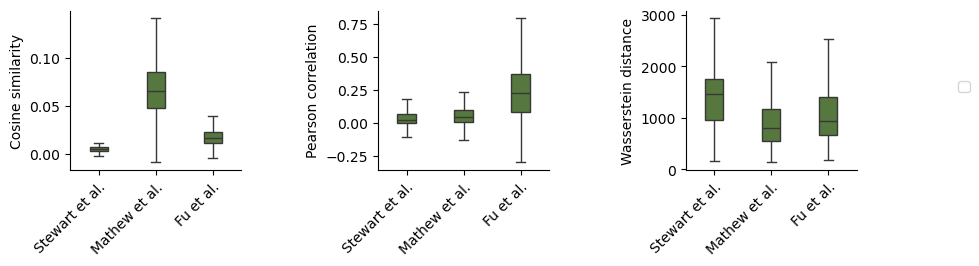

In [140]:
# Figure 4

# set up figure
fig, axs = plt.subplots(1, 3, figsize=(11,2.3))

# a
plt.subplot(1,3,1)
sns.boxplot(x="Dataset", y="Cosine similarity", data=fig4a, 
               gap=0.6, showfliers=False, palette=["#548235"])
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.xlabel("")

# b
plt.subplot(1,3,2)
sns.boxplot(x="Dataset", y="Pearson correlation", data=fig4b, 
               gap=0.6, showfliers=False, palette=["#548235"])
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.xlabel("")

# c
plt.subplot(1,3,3)
sns.boxplot(x="Dataset", y="Wasserstein distance", data=fig4c, 
               gap=0.6, showfliers=False, palette=["#548235"])
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.xlabel("")

sns.despine()
plt.subplots_adjust(top=0.8, right=0.84, wspace=0.8)
plt.legend(bbox_to_anchor=(1.7,0.6))

plt.savefig("figures/4.png", format="png", bbox_inches="tight", dpi=300)

## Supplement 6

### Supplement 6a: number of genes with changed velocity sign per cell

In [114]:
# count number of sign difference per cell

stewart_signs, mathew_signs, fu_signs = [], [], []

for i in range(stewart_velocyto_sto.n_obs):
    stewart_signs.append(np.sum(np.sign(stewart_velocyto_sto.layers["velocity"][i,:]) != np.sign(stewart_alevin_sto.layers["velocity"][i,:])))

for i in range(mathew_velocyto_sto.n_obs):
    mathew_signs.append(np.sum(np.sign(mathew_velocyto_sto.layers["velocity"][i,:]) != np.sign(mathew_alevin_sto.layers["velocity"][i,:])))

for i in range(fu_velocyto_sto.n_obs):
    fu_signs.append(np.sum(np.sign(fu_velocyto_sto.layers["velocity"][i,:]) != np.sign(fu_alevin_sto.layers["velocity"][i,:])))

In [115]:
# get percentage
stewart_sign_perc = [x  / stewart_velocyto_sto.n_vars for x in stewart_signs]
mathew_sign_perc = [ x  / mathew_velocyto_sto.n_vars for x in mathew_signs]
fu_sign_perc = [x / fu_velocyto_sto.n_vars for x in fu_signs]

In [116]:
# create dataframe for violinplot
sup6a = pd.DataFrame({"Proportion": np.concatenate([stewart_sign_perc, mathew_sign_perc, fu_sign_perc]),
                      "Dataset": np.concatenate([["Stewart et al."] * stewart_velocyto_sto.n_obs,
                                                 ["Mathew et al."] * mathew_velocyto_sto.n_obs,
                                                 ["Fu et al."] * fu_velocyto_sto.n_obs])})

### Supplement 6b: similarities between neighbors as reference

In [117]:
# cosine similarity of velocities per cell: compare each cell to nearest neighbor

# Stewart:
cosine_ref_stewart = []

for i in range(stewart_velocyto.n_obs):  
    # get nearest neighbor of each cell
    array = stewart_velocyto_sto.obsp["distances"][i].toarray()
    neighbor = np.argmin(np.where(array > 0, array, np.inf))

    # get cosine similarity 
    cosine_ref_stewart.append(-(cosine(stewart_velocyto_sto.layers["velocity"][i,:], stewart_velocyto_sto.layers["velocity"][neighbor,:])-1))

In [118]:
# Mathew:
cosine_ref_mathew = []

for i in range(mathew_velocyto.n_obs):
   
    # get nearest neighbor of each cell
    array = mathew_velocyto_sto.obsp["distances"][i].toarray()
    neighbor = np.argmin(np.where(array > 0, array, np.inf))

    # get cosine similarity 
    cosine_ref_mathew.append(-(cosine(mathew_velocyto_sto.layers["velocity"][i,:], mathew_velocyto_sto.layers["velocity"][neighbor,:])-1))

In [119]:
# Fu:
cosine_ref_fu = []

# reduce genes to HVGs
fu_hvgs = fu_velocyto.var["highly_variable"].values
fu_velocities = fu_velocyto_sto.layers["velocity"][:,fu_hvgs]

for i in range(fu_velocyto.n_obs):
   
    # get nearest neighbor of each cell
    array = fu_velocyto_sto.obsp["distances"][i].toarray()
    neighbor = np.argmin(np.where(array > 0, array, np.inf))

    # get cosine similarity 
    cosine_ref_fu.append(-(cosine(fu_velocities[i], fu_velocities[neighbor])-1))

In [120]:
# create dataframe
sup6b = pd.DataFrame({"Cosine similarity": np.concatenate([cosine_ref_stewart, cosine_ref_mathew, cosine_ref_fu]),
                      "Dataset": np.concatenate([["Stewart et al."] * stewart_velocyto.n_obs,
                                                 ["Mathew et al."] * mathew_velocyto.n_obs,
                                                 ["Fu et al."] * fu_velocyto.n_obs]),
                      "Method": np.concatenate([["Velocyto"] * stewart_velocyto.n_obs,
                                                ["Velocyto"] * mathew_velocyto.n_obs,
                                                ["Velocyto"] * fu_velocyto.n_obs])})

### Supplement 6 combined

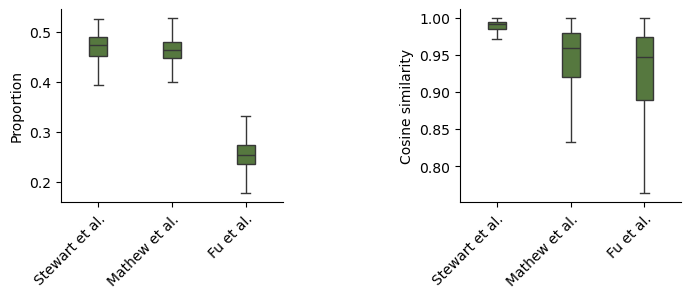

In [141]:
# plot supplement 6

# set up figure
fig, axs = plt.subplots(1, 2, figsize=(8,2.5))

# a
plt.subplot(1,2,1)
#plt.title("Opposite velocities per cell")
sns.boxplot(x="Dataset", y="Proportion", data=sup6a, width=0.4,
               gap=0.4, showfliers=False, palette=["#548235"])
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.xlabel("")

# b
plt.subplot(1,2,2)
#plt.title("Similarity of velocities of nearest neighbors")
sns.boxplot(x="Dataset", y="Cosine similarity", data=sup6b, width=0.4,
               gap=0.4, showfliers=False, palette=["#548235"])
plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.xlabel("")

sns.despine()
plt.subplots_adjust(wspace=0.8)

plt.savefig("figures/supplement_6.png", format="png", bbox_inches="tight", dpi=300)

## Figure 5

saving figure to file figures/5a.png


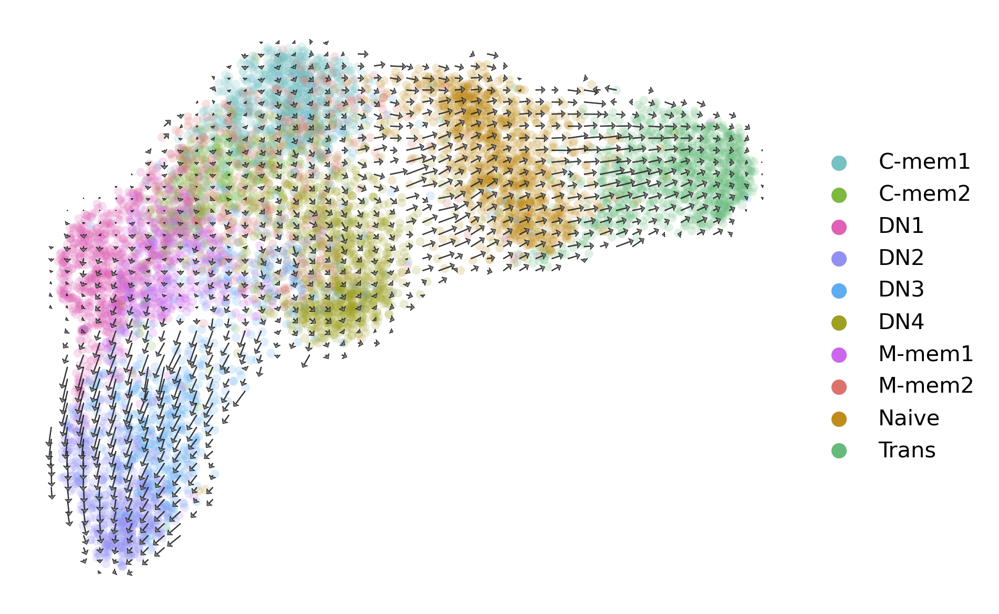

saving figure to file figures/5b.png


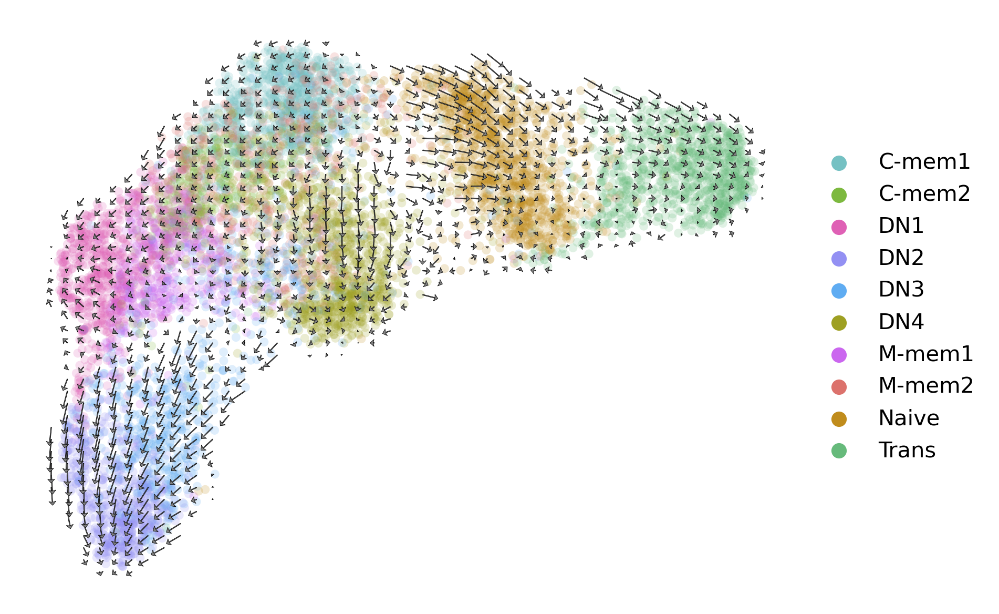

In [142]:
# Stewart: plot velocities in UMAP on grid
scv.pl.velocity_embedding_grid(stewart_velocyto_sto, basis='umap', color="cluster", arrow_length=2, 
                               density=0.9, arrow_size=(10,18,8),
                               legend_loc="right margin", title="", dpi=300, save="figures/5a.png")

scv.pl.velocity_embedding_grid(stewart_alevin_sto, basis='umap', color="cluster", arrow_length=2,
                               density=0.9, arrow_size=(10,18,8),
                               legend_loc="right margin", title="", dpi=300, save="figures/5b.png")

In [123]:
# Stewart: PAGA
scv.tl.paga(stewart_velocyto_sto, groups='cluster')
scv.tl.paga(stewart_alevin_sto, groups='cluster')

computing terminal states
    identified 8 regions of root cells and 1 region of end points .
    finished (0:00:24) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:02) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)
computing terminal states
    identified 9 regions of root cells and 1 region of end points .
    finished (0:00:03) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connect

saving figure to file figures/5c.png


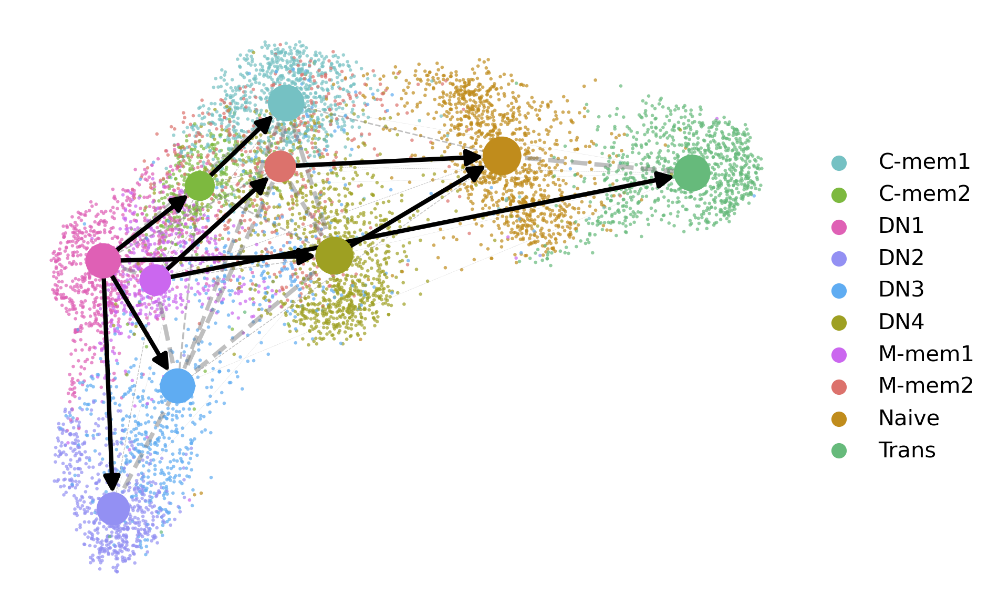

saving figure to file figures/5d.png


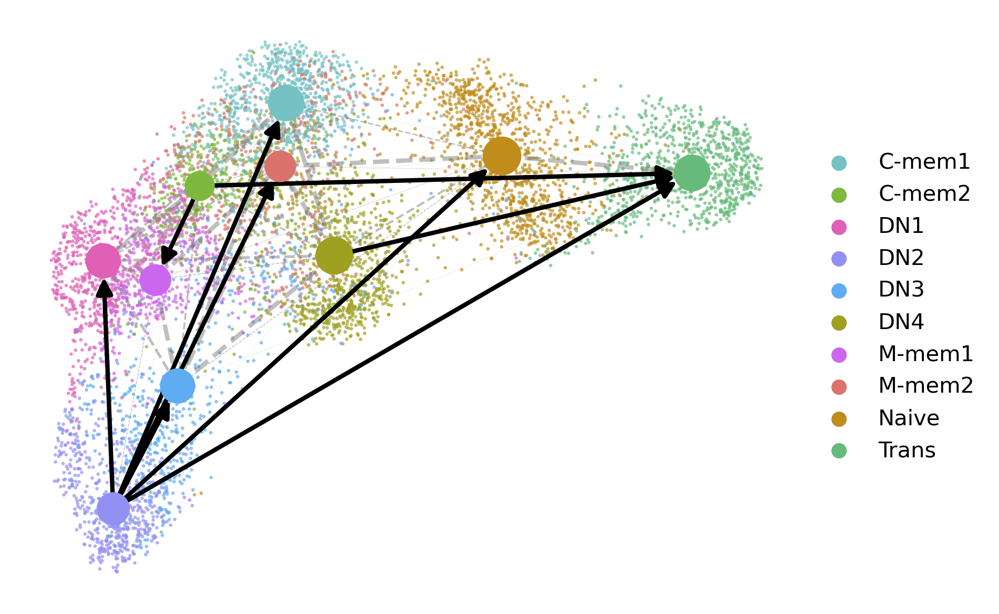

In [143]:
# Stewart: plot PAGA on UMAP
scv.pl.paga(stewart_velocyto_sto, basis='umap', color='cluster', size=10, alpha=0.7, 
            min_edge_width=2, node_size_scale=1.5, title="", dpi=300, save="figures/5c.png")

scv.pl.paga(stewart_alevin_sto, basis='umap', color='cluster', size=10, alpha=0.7, 
            min_edge_width=2, node_size_scale=1.5, title="", dpi=300, save="figures/5d.png")

## Supplement 7

In [125]:
# Mathew: create colormap for UMAP

# list of HEX colors
hex_colors = ["#CD665F", "#BF781C", "#AB871D", "#92941D", "#77A119", "#57AA17", "#64B15A", "#5CB488",
              "#61AFB4", "#5AA6DC", "#5A91F8", "#7D7AFA", "#A760FA", "#C54FE4", "#CB4EC0", "#D3558E"]

# convert HEX colors to RGB
rgb_colors = [(int(color[1:3], 16)/255, int(color[3:5], 16)/255, int(color[5:7], 16)/255) for color in hex_colors]

# create colormap
cmap = ListedColormap(rgb_colors)

# create dictionary to assign colors to clusters
clusters = ["C1", "C2", "C3", "C4", "C5", "C6", "C7", "C8", "C9", "C10", "C11", "C12", "C13", "C14", "C15", "C16"]
umap_colors = {}
i = 0
for cluster in clusters:
    umap_colors[cluster] = cmap.colors[i]
    i+=1

In [126]:
# Mathew: order cluster labels
mathew_velocyto_sto.obs['cluster'] = pd.Categorical(mathew_velocyto_sto.obs['cluster'], categories=clusters, ordered=True)

mathew_alevin_sto.obs['cluster'] = pd.Categorical(mathew_alevin_sto.obs['cluster'], categories=clusters, ordered=True)

saving figure to file figures/supplement_7a.png


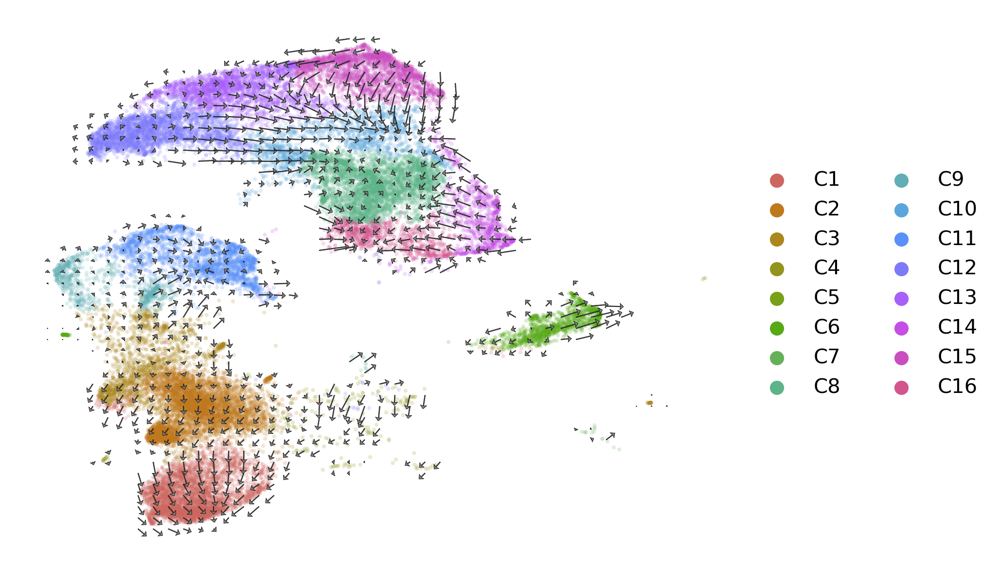

saving figure to file figures/supplement_7b.png


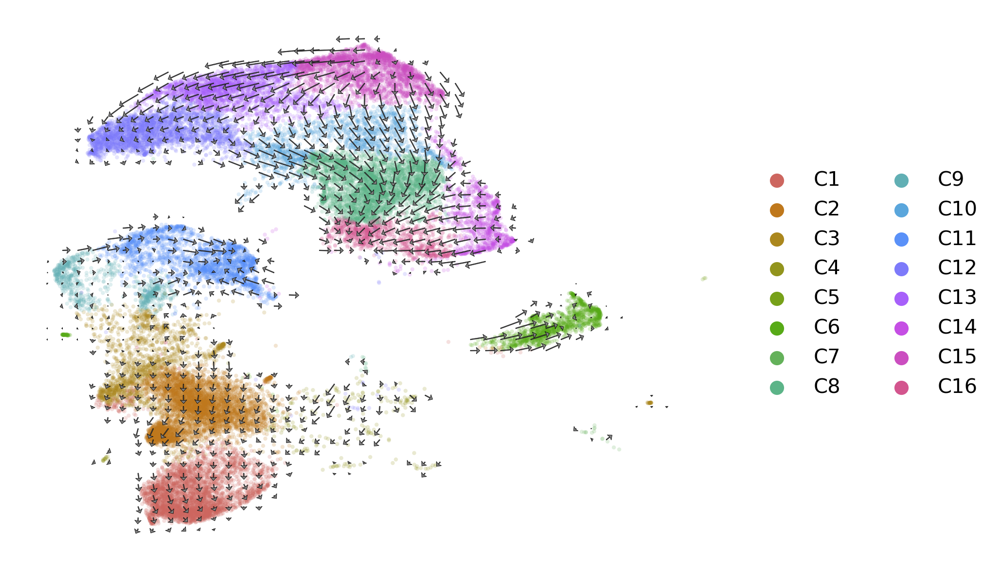

In [144]:
# Mathew: plot velocities in UMAP on grid
scv.pl.velocity_embedding_grid(mathew_velocyto_sto, basis='umap', color="cluster", arrow_length=2, palette=umap_colors,
                               density=0.9, arrow_size=(10,18,8),
                               legend_loc="right margin", title="", dpi=300, save="figures/supplement_7a.png")

scv.pl.velocity_embedding_grid(mathew_alevin_sto, basis='umap', color="cluster", arrow_length=2, palette=umap_colors,
                               density=0.9, arrow_size=(10,18,8),
                               legend_loc="right margin", title="", dpi=300, save="figures/supplement_7b.png")

In [128]:
# choose cell from cluster 3 as root cell --> as described in code from Mathew et al.
root = [i for i, x in enumerate(mathew_velocyto_sto.obs['cluster']) if x == 'C3'][0] 

In [129]:
# Mathew: PAGA
scv.tl.paga(mathew_velocyto_sto, groups='cluster', root_key=root)
scv.tl.paga(mathew_alevin_sto, groups='cluster', root_key=root)

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:08) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)
running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:06) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


saving figure to file figures/supplement_7c.png


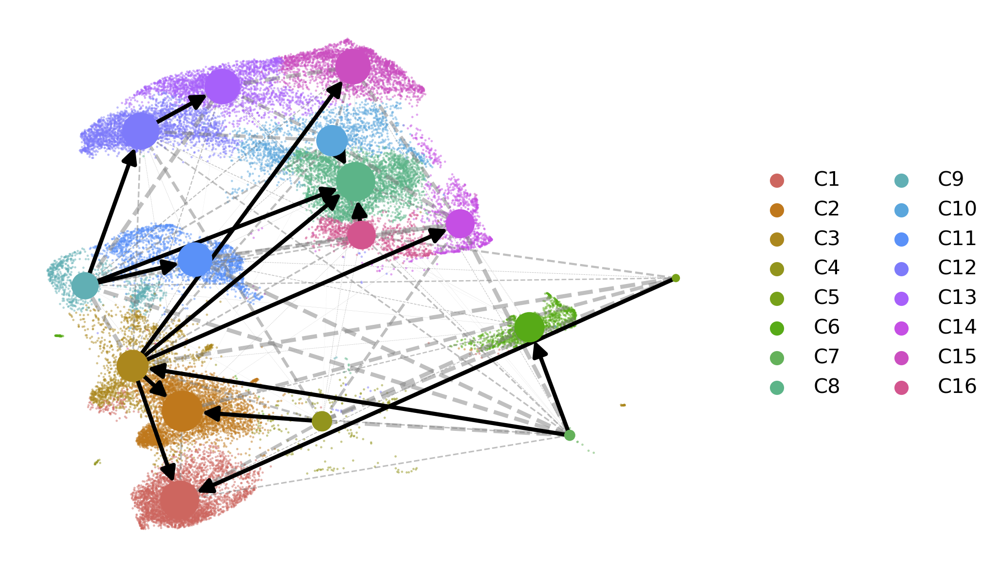

saving figure to file figures/supplement_7d.png


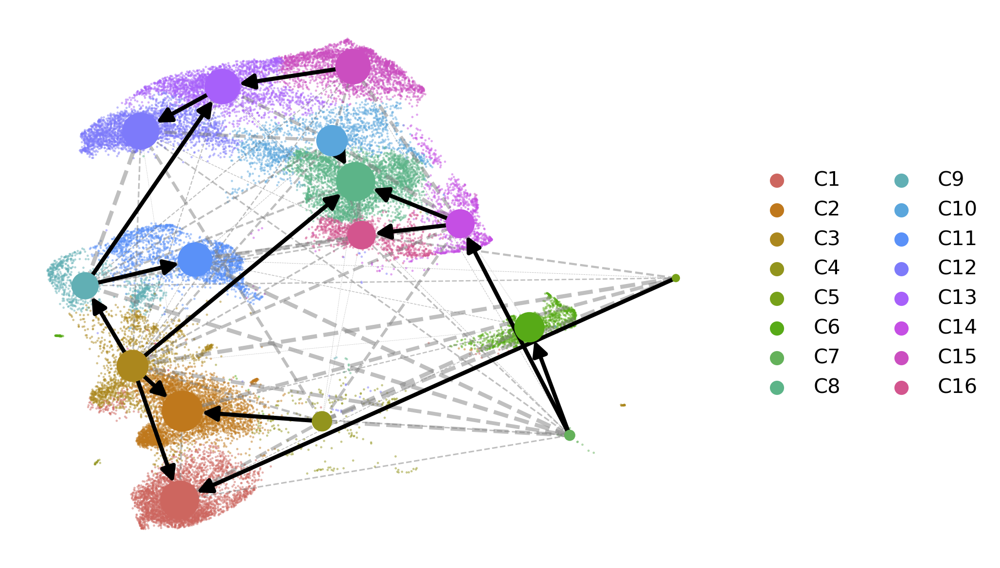

In [145]:
# Mathew: plot PAGA on UMAP
scv.pl.paga(mathew_velocyto_sto, basis='umap', color='cluster', size=5, alpha=0.5, palette=umap_colors,
            min_edge_width=2, node_size_scale=1.5, title="", dpi=300, save="figures/supplement_7c.png")

scv.pl.paga(mathew_alevin_sto, basis='umap', color='cluster', size=5, alpha=0.5, palette=umap_colors,
            min_edge_width=2, node_size_scale=1.5, title="", dpi=300, save="figures/supplement_7d.png")

## Supplement 8

saving figure to file figures/supplement_8a.png


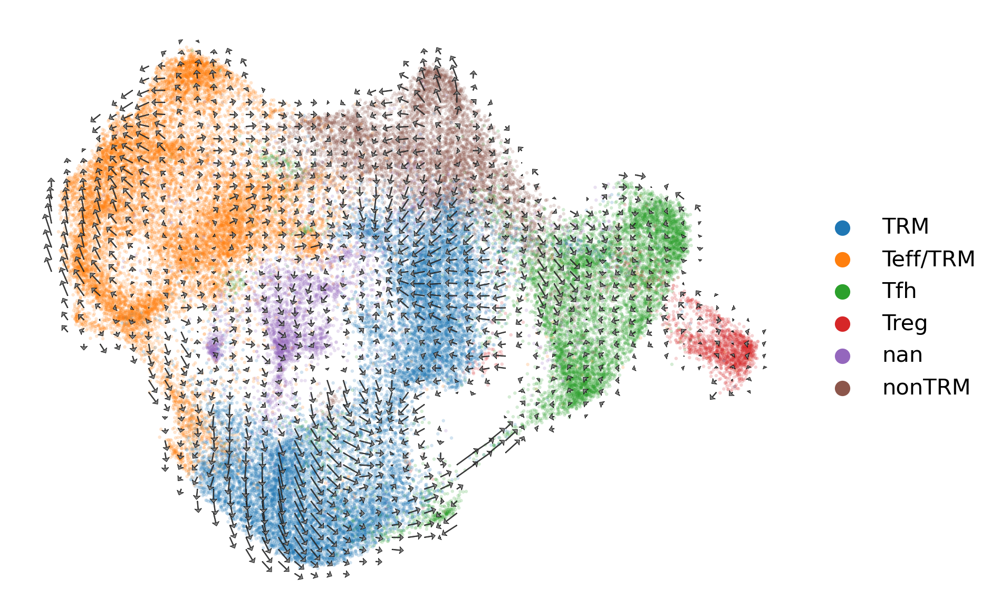

saving figure to file figures/supplement_8b.png


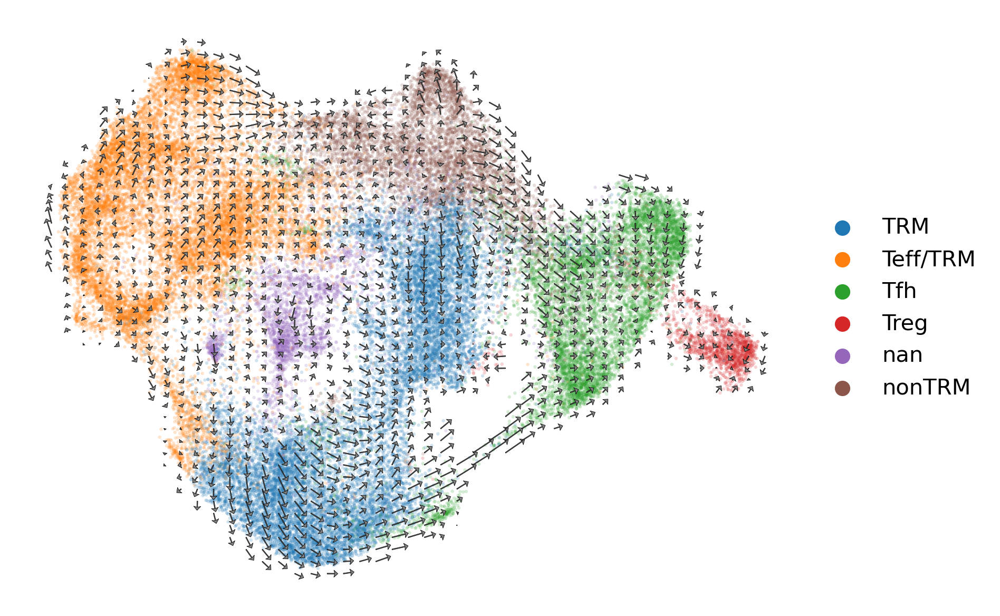

In [146]:
# Fu: plot velocities in UMAP on grid
scv.pl.velocity_embedding_grid(fu_velocyto_sto, basis='umap', color="cluster", arrow_length=2,
                               density=0.9, arrow_size=(10,18,8),
                               legend_loc="right margin", title="", dpi=300, save="figures/supplement_8a.png")

scv.pl.velocity_embedding_grid(fu_alevin_sto, basis='umap', color="cluster", arrow_length=2,
                               density=0.9, arrow_size=(10,18,8),
                               legend_loc="right margin", title="", dpi=300, save="figures/supplement_8b.png")

In [132]:
# Fu: convert cluster labels to strings
fu_velocyto_sto.obs["cluster"] = fu_velocyto_sto.obs["cluster"].astype(str)
fu_alevin_sto.obs["cluster"] = fu_alevin_sto.obs["cluster"].astype(str)

In [133]:
# Fu: PAGA
scv.tl.paga(fu_velocyto_sto, groups='cluster')
scv.tl.paga(fu_alevin_sto, groups='cluster')

computing terminal states
    identified 10 regions of root cells and 1 region of end points .
    finished (0:00:23) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:08) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)
computing terminal states
    identified 8 regions of root cells and 1 region of end points .
    finished (0:00:14) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:10) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connec

saving figure to file figures/supplement_8c.png


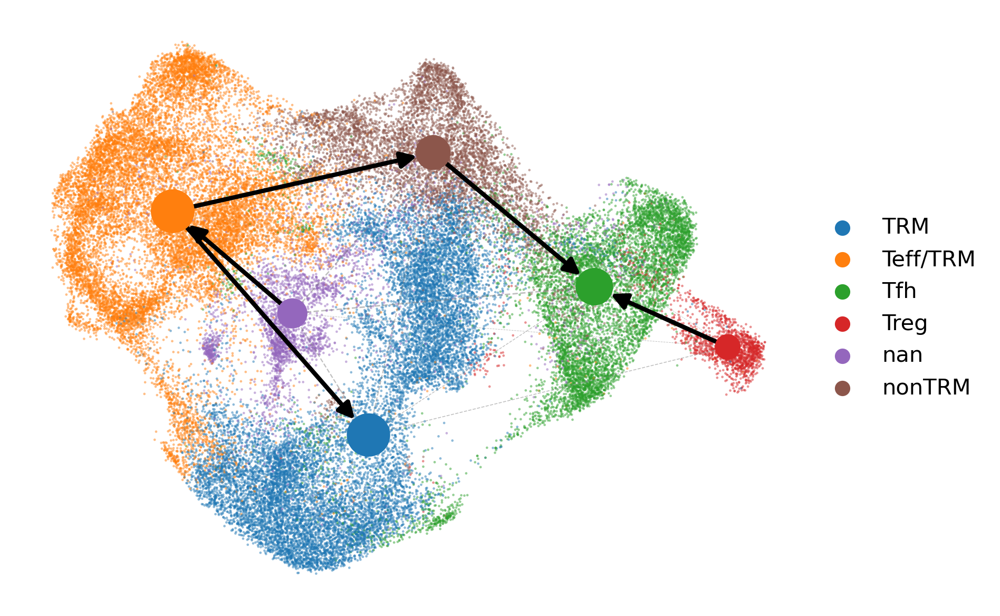

saving figure to file figures/supplement_8d.png


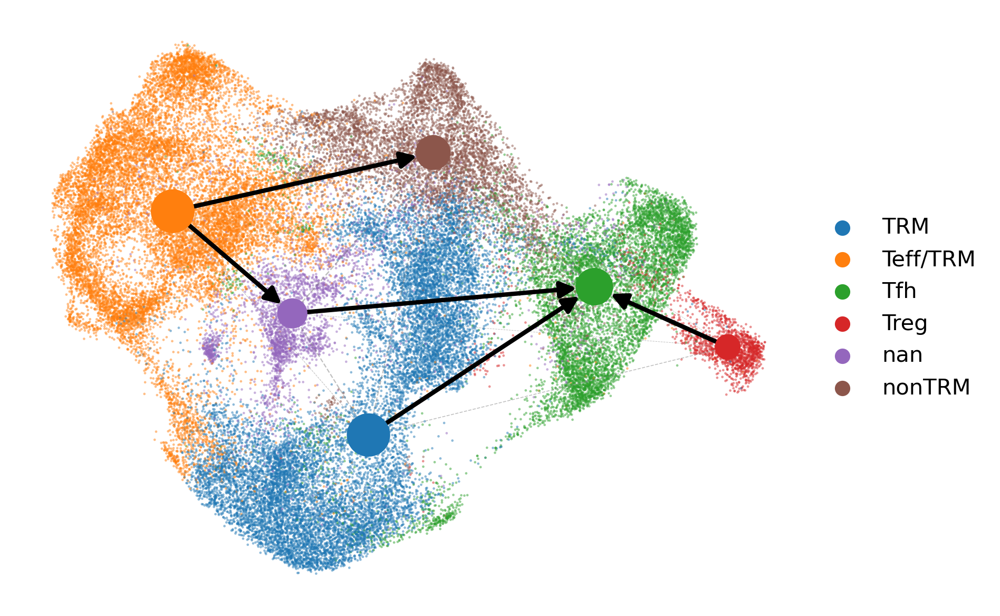

In [147]:
# Fu: plot PAGA on UMAP
scv.pl.paga(fu_velocyto_sto, basis='umap', color='cluster', size=5, alpha=0.5,
            min_edge_width=2, node_size_scale=1.5, title="", dpi=300, save="figures/supplement_8c.png")

scv.pl.paga(fu_alevin_sto, basis='umap', color='cluster', size=5, alpha=0.5,
            min_edge_width=2, node_size_scale=1.5, title="", dpi=300, save="figures/supplement_8d.png")